<div style="font-size: 20px; font-weight: 600;text-transform:uppercase; color:#23547b;text-align:center">
<h1 > BBM 409: Introduction to Machine Learning Lab. </h1>
<h1> Assignment - 4 </h1>
<h1> Vegetable Classification of Images using Neural Network
and CNN
</h1>

</div>


<div style="text-align:center"> 
<h2 > Numan Kafadar 21946242</h2>
<h2> Umut Güngör 21946198</h2>
</div>
<h1  style="color:#805b36 ;background:#FFD8B2"> Importing Necessary Libraries and Data Preprocessing</h1>

In [1]:
#necessary liblaries to import in part 1
import os
import glob
import time
import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, ImageFilter
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import confusion_matrix , ConfusionMatrixDisplay
#ignoring some numpy errors
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)
%matplotlib inline

In [2]:
#paths of image directories
trainpath = "Vegetable Images/train"
validationpath = "Vegetable Images/validation"
testpath = "Vegetable Images/test"

In [3]:
#All Layers in data
class_dict={}
for i , folder in enumerate(os.listdir(trainpath)):
    class_dict[folder] = i  

class_dict

{'Bean': 0,
 'Bitter_Gourd': 1,
 'Bottle_Gourd': 2,
 'Brinjal': 3,
 'Broccoli': 4,
 'Cabbage': 5,
 'Capsicum': 6,
 'Carrot': 7,
 'Cauliflower': 8,
 'Cucumber': 9,
 'Papaya': 10,
 'Potato': 11,
 'Pumpkin': 12,
 'Radish': 13,
 'Tomato': 14}

In [4]:
# a function to obtain images from directory
# returns preprocessed data and label matrixes to use in neural network progress  
def read_images(path, class_dict, size=(60,60), convert_gray = True):
    x = []
    y = []
    #for each file directory
    for folder in os.listdir(path):
        #for each file
        for file_path in glob.glob(str( path +'/' + folder + '/*.jpg')):
            img = Image.open(file_path) #openning image
            if convert_gray: 
                img = img.convert('L')  #grayscale image 
            img = img.resize(size)  #resizing image
            img = np.array(img)  #converting image to numpy array
            x.append(img) 
            y.append(class_dict[folder])
        
    x = np.array(x)
    y = np.array(y)
    
    #normalization
    x = x.astype('float32')/255.0
    
    #one-hot-encoding of label values
    y_processed = np.zeros((15, x.shape[0]))
    for col in range ( x.shape[0]):
        val=y[col]
        for i in range (15):
            if (val==i):
                y_processed[val,col]=1
                
    x = x.reshape(x.shape[0], -1).T  #flatten process
    return x, y_processed

In [5]:
#reading our train , validation and test data
x_train, y_train = read_images(trainpath, class_dict, size=(60,60), convert_gray=True)
x_validation, y_validation = read_images(validationpath, class_dict, size=(60,60), convert_gray=True)
x_test, y_test = read_images(testpath, class_dict, size=(60,60), convert_gray=True)

We resized our images with the shape of (60,60). Because our data is too large and resizing with images original shapes (224,224) would cause RAM error and long execution time, (60,60) is optimal in terms of both time and memory allocation.
Also , grayscale operation applied.

In [6]:
#train , validation and test matrixes shapes
print("Train Data Shape : ",x_train.shape)
print("Train Label Shape : ", y_train.shape) 
print("Validation Data Shape : ", x_validation.shape)
print("Validation Label Shape : ", y_validation.shape)
print("Test Data Shape : ", x_test.shape)
print("Test Label Shape : ", y_test.shape)

Train Data Shape :  (3600, 15000)
Train Label Shape :  (15, 15000)
Validation Data Shape :  (3600, 3000)
Validation Label Shape :  (15, 3000)
Test Data Shape :  (3600, 3000)
Test Label Shape :  (15, 3000)


In [7]:
#shuffling train data
keys = np.array(range(x_train.shape[1]))
np.random.shuffle(keys)
x_train = x_train[:, keys]
y_train = y_train[:, keys]

<h1  style="color:#805b36 ;background:#FFD8B2"> Visualizing Some Random Images From Dataset</h1>

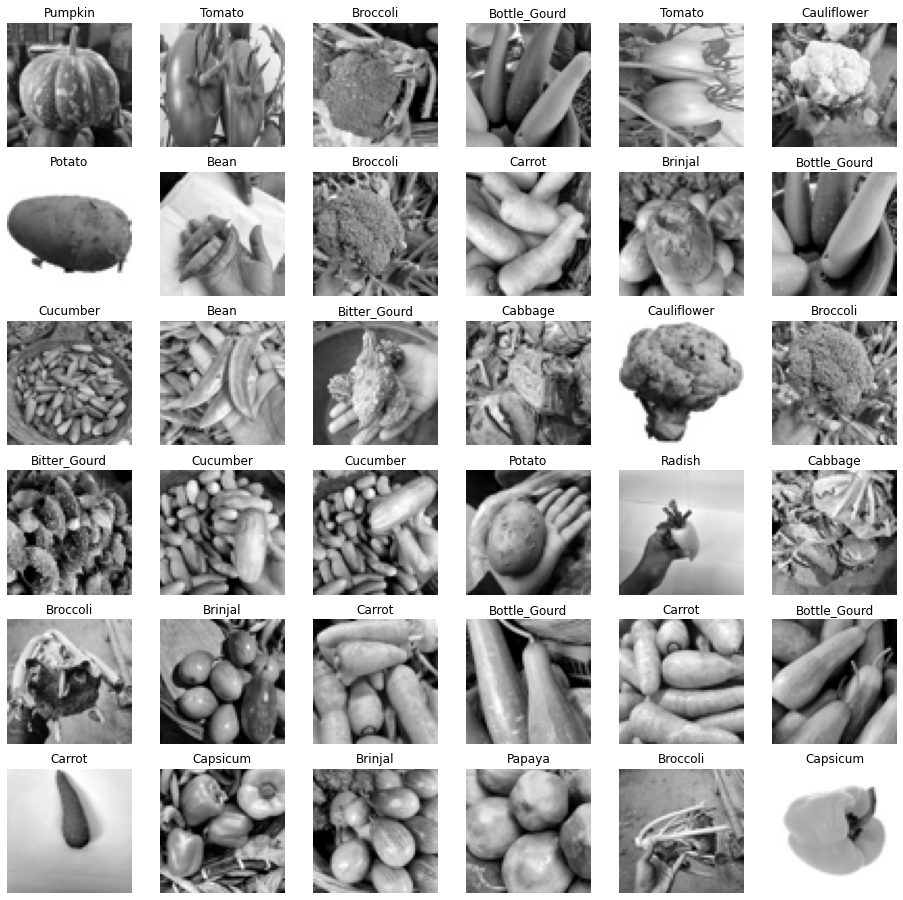

In [8]:
#reverse layer list
reverse_class_list = {}
for key in class_dict:
    reverse_class_list[class_dict[key]] = key
    
#visualizing some random images from our data
fig = plt.figure(figsize=(16, 16))
for i in range(1,37):
    img_index = np.random.randint(0,x_train.shape[1])
    fig.add_subplot(6, 6, i)
    plt.imshow(x_train[:,img_index].reshape((60,60)), cmap='gray')
    plt.axis('off')
    plt.title(reverse_class_list[np.argmax(y_train[:, img_index], axis=0)])
    

<h1 style="font-size: 40px; font-weight: 600;text-transform:uppercase; color:#256029; background:#C8E6C9"> Part 1:  Multi Layer Neural Network </h1>

<h3 style="font-weight: 600;text-transform:uppercase; color:#c63737 ; background:#FFCDD2"> Problem Definition,Solution Steps and Implementation</h3>
<ul>
        <li><span style="color:#c63737 ;">Problem Definition </span>In this part of the assignment, we will implement multilayer neural network for classification.  We will implement forward and backward propagations with
the loss function and learning settings. Our neural network will have one input layer , one output layer and n hidden layers.

</li>  
    <li><span style="color:#c63737 ; ">Solution Steps and Implementation : </span> 
        To implement a neural network, we first need to understand its structure. 
A neural network is a method in artificial intelligence that teaches computers to process data in a way that is inspired by the human brain. It consists one input layer , one output layer and n hidden layers like below.
        <img src="https://i.ibb.co/Cn7vbYN/neural-network.jpg" width="600" height="600">
        Each layer consists of neurons which are basically floating numbers. There are connections between each layers called as weights and and each neuron also has its bias values.<br>
        To implement neural network , we first need to define our activation functions. Common activation functions used in Neural Network are Sigmoid, ReLU and tanh functions. We also need to implement derivate of activation functions to use in backward propagation.
    </li> 
</ul>

In [9]:
#activation functions
#for input and hidden layers
def sigmoid(x):
    return 1.0/(1.0+np.exp(-x))

def tanh(x):
    return np.tanh(x)

def ReLU(x):
    return np.maximum(0 , x)

#for output layer
def softmax(x):
    eX = np.exp(x- np.max(x))
    return eX/eX.sum(axis =0 ,keepdims=True)

#derivate of activation functions
def der_sigmoid(z):
    return sigmoid(z)*(1-sigmoid(z))

def der_tanh(z):
    return 1-tanh(z)*tanh(z)

def der_relu(z):
    return np.greater(z, 0)


In [10]:
#functions for saving and loading our trained models later use in test data
#to run this there should be a directory named models
def save_model(weights, biases , path):
    with open("models/" + path + ".npy", 'wb') as f:
        np.save(f, weights)
        np.save(f, biases)
        
def load_model(path):
     with open("models/" + path + ".npy", 'rb') as f:
        weights = np.load(f ,allow_pickle=True)
        biases = np.load(f ,allow_pickle=True)
        return weights, biases

<ul>
    <li>
     After implementing activation functions , we then initialize our starter weights and biases to train our model. We initialize weights with random numbers using normal distribution and biases with 0. 
    </li>
    <li>
    After initializing weights and biases , we do the forward propagation progress on train data using weights and biases. Formula for forward propagation is given below.
     <img src="https://i.stack.imgur.com/CNkgy.png"  width="500" height="600">
      We used softmax function in output layer and user choice activation function in other layers.
    </li>
    <li>
     As a cost function , we used Negative Log-Likelihood (NLL) below.
     <img src=" https://miro.medium.com/max/1400/1*1l6MYQcDD5bIlFn1TfTNPA.png"  width="500" height="100">
    </li>
    <li>
     At backward propagation part , we calculate the derivative of the error with respect to the parameters (∂E/∂W, ∂E/∂B) and  the input (∂E/∂X).
    </li>
    <li>
     We will implement mini-batch gradient descent algorithm with batch size between (16 − 128) and learning rate between 
        (0.005 − 0.02). Mini-batch gradient descent is a variation of the gradient descent algorithm that splits the training dataset into small batches that are used to calculate model error and update model coefficients.
    </li>
</ul>

In [11]:
#function to initialize starter parameters
def initilaize_biases_and_weights(layers):
    
    #The list 'layers' contains the number of neurons in the respective layers.
    #For example, if 'layers' is [10,5,1] ,then the input layer has 10 neurons ,
    #the output layer has 1 neuron and network contains 1 hidden layer which has 5 neurons.
    
    biases = []
    weights = []
   
    for i in range(1,len(layers)):
        #initilaize biases to 0
        biases.append(np.zeros((layers[i] ,1)))
        #initilaize weights to random numbers using normal distribution
        weights.append(np.random.randn(layers[i] , layers[i-1])*0.01)
    return weights , biases


def forward_prop(X_train, weights, biases, activation_function):
    activation_func_list = {'sigmoid': sigmoid, 'ReLU':ReLU,'relu':ReLU, 'tanh':tanh } #activation functions
    forward_activation = activation_func_list[activation_function] #used activation function
    
    forward_results = [] #results array 
    A = X_train
    k = len(weights)-1 #number of layers without output layer
    for i in range(k):
        Z = np.dot(weights[i], A)+biases[i]  #Z = XW+B
        #user choice activation function used in input layer and hidden layers
        A = forward_activation(Z)  #A = activation_function(Z)
        forward_results.append({'z':Z, 'a':A}) #append to the result array
        
    #softmax function used in output layer
    Z = np.dot(weights[k], A)+biases[k]
    A = softmax(Z)
    forward_results.append({'z':Z, 'a':A})
    return forward_results

def cost_function(A, y_train):
    #length of y_train 
    m = y_train.shape[1] if y_train.shape[1]>0 else 1
    #cost = - np.sum( np.multiply(np.log(A),y_train)) / m
    #negative log-likelihood function
    cost = -np.sum( np.multiply(np.log(A),y_train) +  np.multiply((1-y_train),np.log(1-A ))) / m
    return cost

def backward_prop(X_train, y_train, weights, biases, forward_results, batch_size, activation_function):
    activation_func_list = {'sigmoid': der_sigmoid, 'ReLU':der_relu,'relu':der_relu, 'tanh':der_tanh } #derivates of activation functions
    backward_activation = activation_func_list[activation_function] #user choice derivative function
    
    L = len(forward_results)-1 #number of layers except output layer
    backward_results = [0]* (L+1) #resulting array
    dZ = forward_results[L]['a'] - y_train  #output layer derivative calculated
    #derivatie of weights
    if(L==0):
        dW = (1.0/batch_size) * np.dot(dZ, X_train.T) 
    else:
        dW = (1.0/batch_size) * np.dot(dZ, forward_results[L-1]['a'].T)
    #derivative of biases
    dB = (1.0/batch_size) * np.sum(dZ, axis=1, keepdims=True)
    
    backward_results[L] = {'dW':dW, 'dB':dB }
    
    for i in reversed(range(L)): #start from last hidden layer to input layer
        dA = np.dot(weights[i+1].T , dZ)
        
        dZ = dA * backward_activation(forward_results[i]['a'])
        
        #derivatie of weights
        if(i==0):
            dW = (1.0/batch_size) * np.dot(dZ, X_train.T)
        else:
            dW = (1.0/batch_size) * np.dot(dZ, forward_results[i-1]['a'].T)
            
        dB = (1.0/batch_size) * np.sum(dZ, axis=1, keepdims=True)  #derivative of biases
       
        backward_results[i] = {'dW':dW, 'dB':dB }
    
    return backward_results

def update_weights_and_biases(weights, biases, backward_results , learning_rate):
    
    for i in range(len(weights)):
        #update weights and biases with backward results and learning rate
        biases[i] =biases[i]-learning_rate * backward_results[i]['dB']
        weights[i] =weights[i]-learning_rate * backward_results[i]['dW']
    return weights, biases


def predict(X_test,y_test,weights,biases, activation_function='ReLU'):
    forward_results = forward_prop(X_test, weights, biases, activation_function)
    predictions = np.argmax(forward_results[-1]['a'], axis=0)
    labels = np.argmax(y_test, axis=0)
    return forward_results, predictions , labels
    

def train(X_train, Y_train, X_valid ,Y_valid , layer_dimns, activation_function='ReLU', epochs = 5, batch_size = 128,
          learning_rate=0.02):
    print('Training begins...')
    st =time.time()
    
    #arrays for plotting total training loss, validation loss and validation accuracy
    loss_arr = []
    valid_loss_arr = []
    valid_acc_arr = []
    last_Accuracy = 0  #last accuracy value for early stopping
   
    weights, biases = initilaize_biases_and_weights(layer_dimns) #initialize weights and biases 
    batches = -(-X_train.shape[1] // batch_size) #number of batches
    
    for i in range(epochs+1):
        #shuffling train data
        keys = np.array(range(X_train.shape[1]))
        np.random.shuffle(keys)
        X_train = X_train[:, keys]
        Y_train = Y_train[:, keys]
        #for early stopping
        weightsPrev, biasesPrev = weights.copy(), biases.copy()
        
        total_loss = 0
        for j in range(batches):
            #data sample for training 
            begin = j * batch_size
            end = min(begin + batch_size, X_train.shape[1] - 1)
            x = X_train[:, begin:end]
            y = Y_train[:, begin:end]
            batch_len = end-begin
            #forward propagation
            forward_results = forward_prop(x, weights, biases, activation_function)
            #backward propagation
            backward_results = backward_prop(x, y, weights, biases, forward_results, batch_len, activation_function)
            #updating weights and biases 
            weights, biases = update_weights_and_biases(weights, biases, backward_results, learning_rate)
            #add to the total cost
            total_loss += cost_function(forward_results[-1]['a'], y)
        loss_arr.append(total_loss)
        
        #calculate validation accuracy and loss
        forward_results_valid, predictions , labels = predict(X_valid, Y_valid, weights, biases, activation_function)
        new_acc = accuracy_score(predictions, labels)*100        
        loss_valid = cost_function(forward_results_valid[-1]['a'], Y_valid)
        
        valid_acc_arr.append(new_acc)
        valid_loss_arr.append(loss_valid)
        #every 10 epoch, display the total training loss, validation loss and validation accuracy
        if i%10==0  :
            print("""Epoch {}: Total Training Loss = {:.3f} , Validation Loss = {:.3f} , Validation Accuracy = {:.3f}
            """.format(i ,total_loss, loss_valid ,  new_acc))
            
            #Early Stopping Applied
            if new_acc <last_Accuracy:
                print('Early Stopping applied.')
                print_plots(loss_arr, valid_loss_arr, valid_acc_arr)
                return weightsPrev, biasesPrev
            
            last_Accuracy = new_acc

    print('Training done in {:.3f} seconds \n'.format(time.time()-st))
    
    print_plots(loss_arr, valid_loss_arr, valid_acc_arr)
    return weights, biases

#fuction to plot total training loss, validation loss and validation accuracy
def print_plots(loss_arr, valid_loss_arr, valid_acc_arr):
    fig = plt.figure(figsize=(14, 14))
    fig.add_subplot(4,3,1)
    plt.plot(loss_arr)
    plt.title('Total Training Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    fig.add_subplot(4,3,2)
    plt.plot(valid_loss_arr)
    plt.title('Validation Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    fig.add_subplot(4,3,3)
    plt.plot(valid_acc_arr)
    plt.title('Validation Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')

<h1  style="color:#805b36 ;background:#FFD8B2"> Training and Saving Some Models</h1>

In [12]:
#input and output layer shapes
input_layer = x_train.shape[0] #input layer
output_layer = y_train.shape[0] #output layer

layer_dims_0 = [input_layer , output_layer ]  # No hidden layers
layer_dims_1 = [input_layer, 144 , output_layer ]  # 1 hidden layer
layer_dims_2 = [input_layer, 144 , 64 , output_layer ]  # 2 hidden layers



Model with No Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005
Training begins...
Epoch 0: Total Training Loss = 3265.917 , Validation Loss = 3.409 , Validation Accuracy = 19.267
            
Epoch 10: Total Training Loss = 2784.665 , Validation Loss = 3.175 , Validation Accuracy = 33.200
            
Epoch 20: Total Training Loss = 2644.804 , Validation Loss = 3.047 , Validation Accuracy = 33.733
            
Epoch 30: Total Training Loss = 2546.109 , Validation Loss = 2.989 , Validation Accuracy = 36.667
            
Training done in 16.287 seconds 

Model with No Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005
Training begins...
Epoch 0: Total Training Loss = 3268.726 , Validation Loss = 3.413 , Validation Accuracy = 17.967
            
Epoch 10: Total Training Loss = 2787.204 , Validation Loss = 3.135 , Validation Accuracy = 31.367
            
Epoch 20: Total Training Loss = 2644.927 , Validation Loss = 3.043 , Validation A

Epoch 20: Total Training Loss = 675.731 , Validation Loss = 3.088 , Validation Accuracy = 35.233
            
Epoch 30: Total Training Loss = 649.243 , Validation Loss = 3.086 , Validation Accuracy = 33.400
            
Early Stopping applied.
Model with No Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.02 
Training begins...
Epoch 0: Total Training Loss = 418.751 , Validation Loss = 4.277 , Validation Accuracy = 10.000
            
Epoch 10: Total Training Loss = 365.079 , Validation Loss = 3.452 , Validation Accuracy = 21.567
            
Epoch 20: Total Training Loss = 349.968 , Validation Loss = 3.179 , Validation Accuracy = 30.600
            
Epoch 30: Total Training Loss = 339.238 , Validation Loss = 3.160 , Validation Accuracy = 31.233
            
Training done in 16.585 seconds 

Model with No Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.02
Training begins...
Epoch 0: Total Training Loss = 418.556 , Validation Loss = 3.

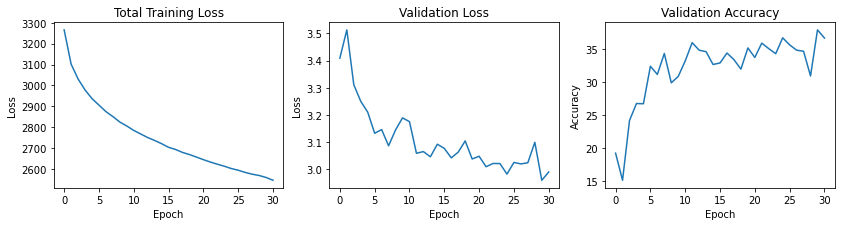

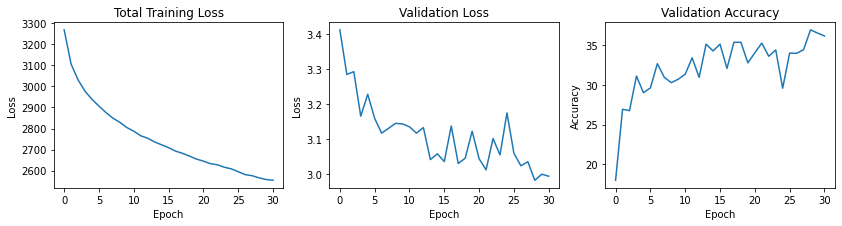

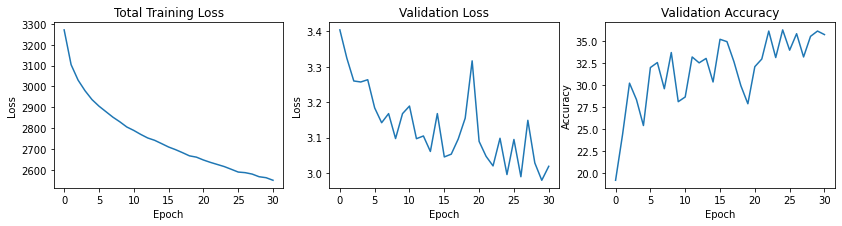

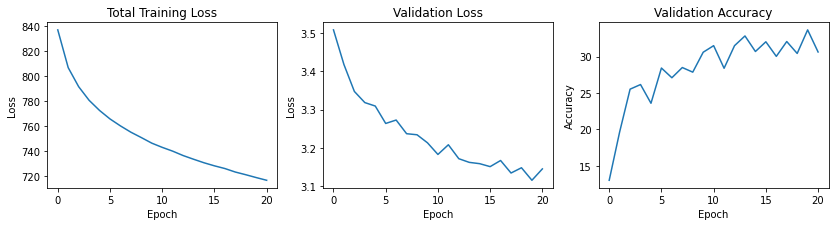

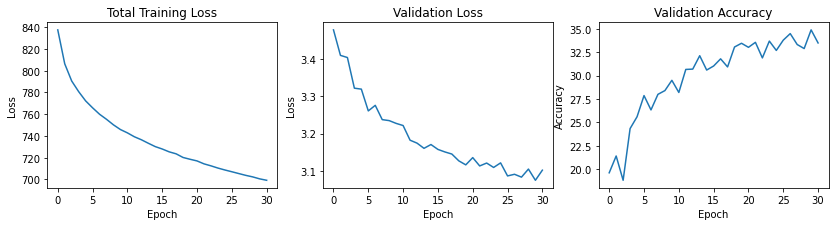

...

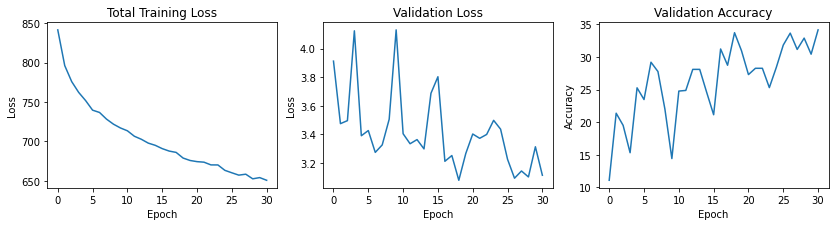

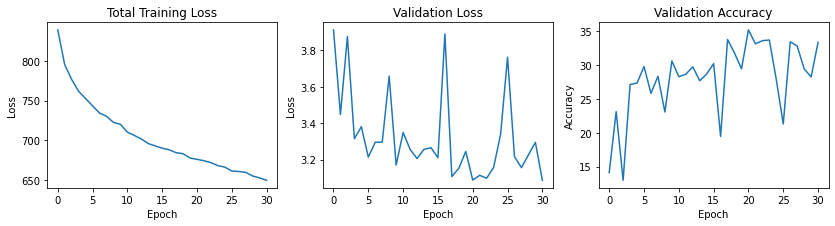

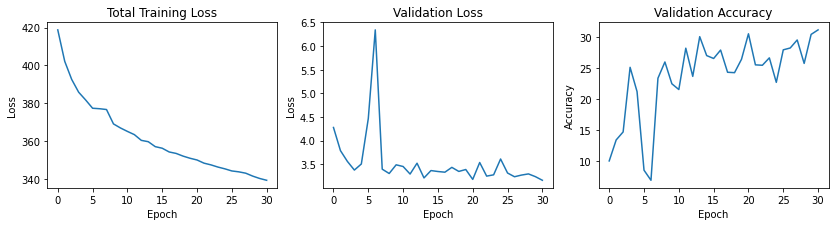

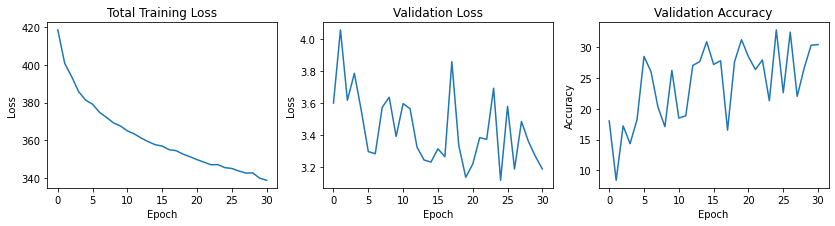

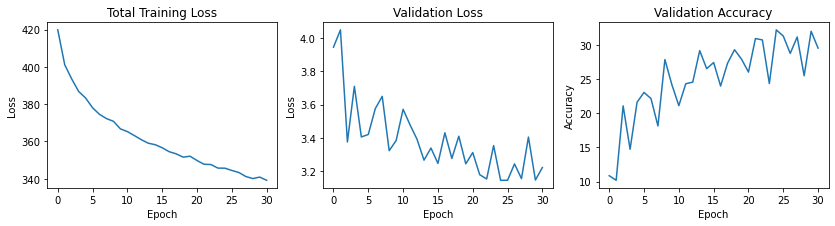

In [13]:
allModelNames_0hl = []
print('Model with No Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='sigmoid',
                        epochs = 30, batch_size = 16, learning_rate=0.005)
save_model(weights, biases, 'model_0hl_sigmoid_16bs_005lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005 ',
                      'model_0hl_sigmoid_16bs_005lr'])

print('Model with No Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='tanh',
                        epochs = 30, batch_size = 16, learning_rate=0.005)
save_model(weights, biases, 'model_0hl_tanh_16bs_005lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005 ',
                      'model_0hl_tanh_16bs_005lr'])

print('Model with No Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='ReLU',
                        epochs = 30, batch_size = 16, learning_rate=0.005)
save_model(weights, biases, 'model_0hl_relu_16bs_005lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.005 ',
                      'model_0hl_relu_16bs_005lr'])

print('Model with No Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='sigmoid',
                        epochs = 30, batch_size = 64, learning_rate=0.005)
save_model(weights, biases, 'model_0hl_sigmoid_64bs_005lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.005 ',
                      'model_0hl_sigmoid_64bs_005lr'])

print('Model with No Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.005' )
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='tanh',
                        epochs = 30, batch_size = 64, learning_rate=0.005)
save_model(weights, biases, 'model_0hl_tanh_64bs_005lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.005 ',
                      'model_0hl_tanh_64bs_005lr'])
      
print('Model with No Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='ReLU',
                        epochs = 30, batch_size = 64, learning_rate=0.005)
save_model(weights, biases, 'model_0hl_relu_64bs_005lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.005 ',
                      'model_0hl_relu_64bs_005lr'])

print('Model with No Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='sigmoid',
                        epochs = 30, batch_size = 128, learning_rate=0.005)
save_model(weights, biases, 'model_0hl_sigmoid_128bs_005lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.005 ',
                      'model_0hl_sigmoid_128bs_005lr'])

print('Model with No Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='tanh',
                        epochs = 30, batch_size = 128, learning_rate=0.005)
save_model(weights, biases, 'model_0hl_tanh_128bs_005lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.005 ',
                      'model_0hl_tanh_128bs_005lr'])

print('Model with No Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='ReLU',
                        epochs = 30, batch_size = 128, learning_rate=0.005)
save_model(weights, biases, 'model_0hl_relu_128bs_005lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.005 ',
                      'model_0hl_relu_128bs_005lr'])

print('Model with No Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='sigmoid',
                        epochs = 30, batch_size = 16, learning_rate=0.02)
save_model(weights, biases, 'model_0hl_sigmoid_16bs_02lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.02 ',
                      'model_0hl_sigmoid_16bs_02lr'])

print('Model with No Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='tanh',
                        epochs = 30, batch_size = 16, learning_rate=0.02)
save_model(weights, biases, 'model_0hl_tanh_16bs_02lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.02 ',
                      'model_0hl_tanh_16bs_02lr'])

print('Model with No Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='ReLU',
                        epochs = 30, batch_size = 16, learning_rate=0.02)
save_model(weights, biases, 'model_0hl_relu_16bs_02lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 ',
                      'model_0hl_relu_16bs_02lr'])

print('Model with No Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='sigmoid',
                        epochs = 30, batch_size = 64, learning_rate=0.02)
save_model(weights, biases, 'model_0hl_sigmoid_64bs_02lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.02 ',
                      'model_0hl_sigmoid_64bs_02lr'])

print('Model with No Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='tanh',
                        epochs = 30, batch_size = 64, learning_rate=0.02)
save_model(weights, biases, 'model_0hl_tanh_64bs_02lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.02 ',
                      'model_0hl_tanh_64bs_02lr'])

print('Model with No Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='ReLU',
                        epochs = 30, batch_size = 64, learning_rate=0.02)
save_model(weights, biases, 'model_0hl_relu_64bs_02lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.02 ',
                      'model_0hl_relu_64bs_02lr'])

print('Model with No Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='sigmoid',
                        epochs = 30, batch_size = 128, learning_rate=0.02)
save_model(weights, biases, 'model_0hl_sigmoid_128bs_02lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.02 ',
                      'model_0hl_sigmoid_128bs_02lr'])

print('Model with No Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.02')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='tanh',
                        epochs = 30, batch_size = 128, learning_rate=0.02)
save_model(weights, biases, 'model_0hl_tanh_128bs_02lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.02',
                      'model_0hl_tanh_128bs_02lr'])

print('Model with No Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_0,  activation_function='ReLU',
                        epochs = 30, batch_size = 128, learning_rate=0.02)
save_model(weights, biases, 'model_0hl_relu_128bs_02lr')
allModelNames_0hl.append(['Model with No Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.02 ',
                      'model_0hl_relu_128bs_02lr'])

print('Each models Total Training Loss, Validation Loss and Validation Accuracy plots respectively \n')

Model with one Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005
Training begins...
Epoch 0: Total Training Loss = 3446.770 , Validation Loss = 3.671 , Validation Accuracy = 10.600
            
Epoch 10: Total Training Loss = 3355.090 , Validation Loss = 3.582 , Validation Accuracy = 16.100
            
Epoch 20: Total Training Loss = 3303.313 , Validation Loss = 3.525 , Validation Accuracy = 14.667
            
Early Stopping applied.
Model with one Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005
Training begins...
Epoch 0: Total Training Loss = 3411.537 , Validation Loss = 3.579 , Validation Accuracy = 13.400
            
Epoch 10: Total Training Loss = 2891.862 , Validation Loss = 3.117 , Validation Accuracy = 32.233
            
Epoch 20: Total Training Loss = 2540.814 , Validation Loss = 2.815 , Validation Accuracy = 40.267
            
Epoch 30: Total Training Loss = 2239.385 , Validation Loss = 2.644 , Validation Accuracy 

Epoch 10: Total Training Loss = 696.723 , Validation Loss = 3.006 , Validation Accuracy = 34.367
            
Epoch 20: Total Training Loss = 578.681 , Validation Loss = 2.986 , Validation Accuracy = 33.167
            
Early Stopping applied.
Model with one Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.02 
Training begins...
Epoch 0: Total Training Loss = 433.532 , Validation Loss = 3.674 , Validation Accuracy = 6.667
            
Epoch 10: Total Training Loss = 425.687 , Validation Loss = 3.605 , Validation Accuracy = 14.000
            
Epoch 20: Total Training Loss = 421.671 , Validation Loss = 3.576 , Validation Accuracy = 15.633
            
Epoch 30: Total Training Loss = 419.129 , Validation Loss = 3.553 , Validation Accuracy = 17.200
            
Training done in 44.959 seconds 

Model with one Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.02
Training begins...
Epoch 0: Total Training Loss = 432.067 , Validation Loss = 3

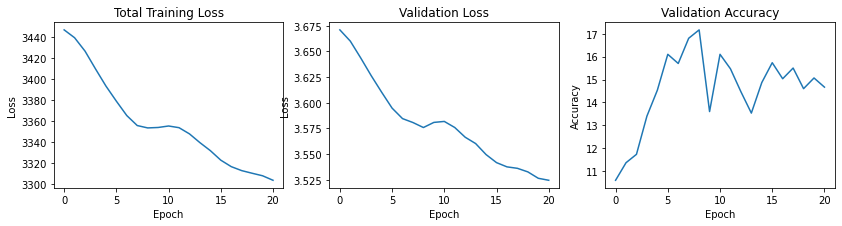

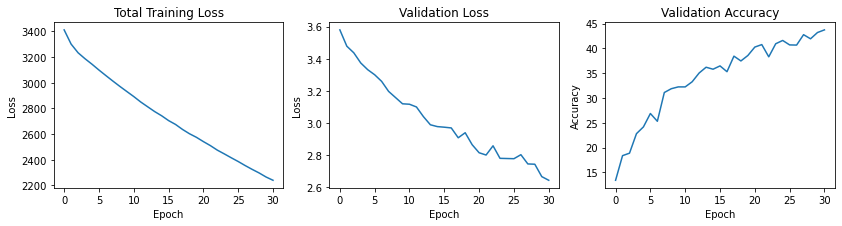

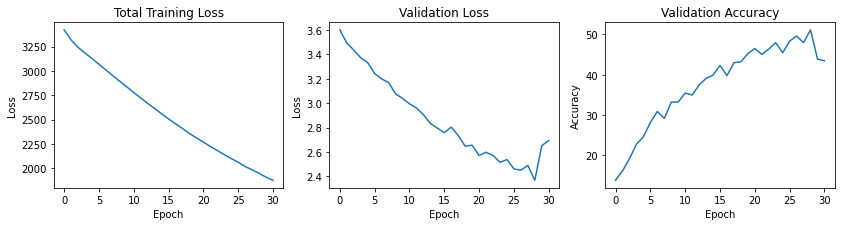

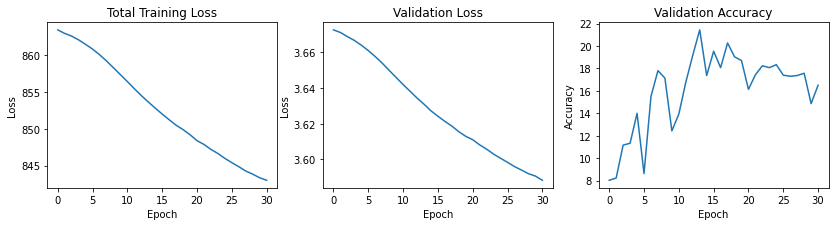

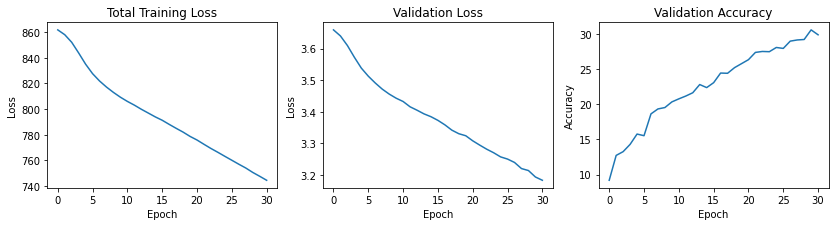

...

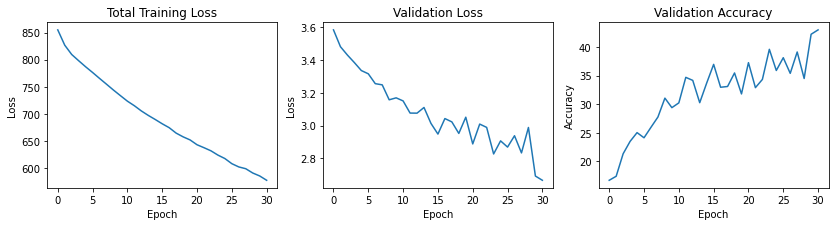

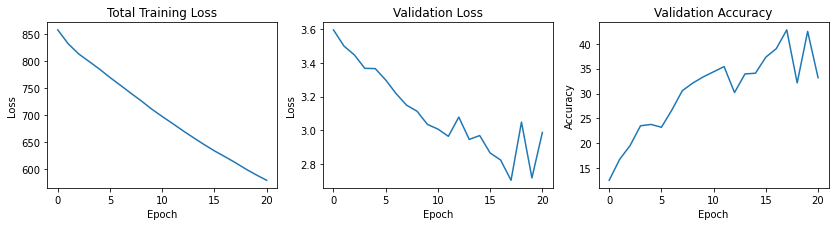

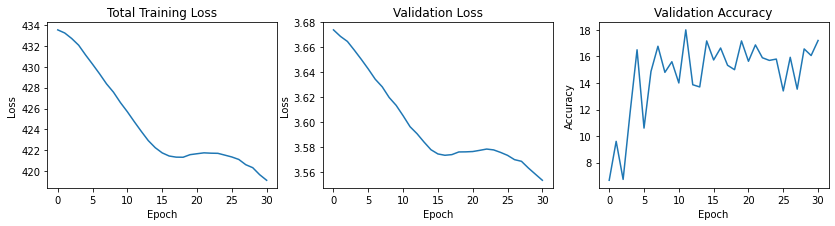

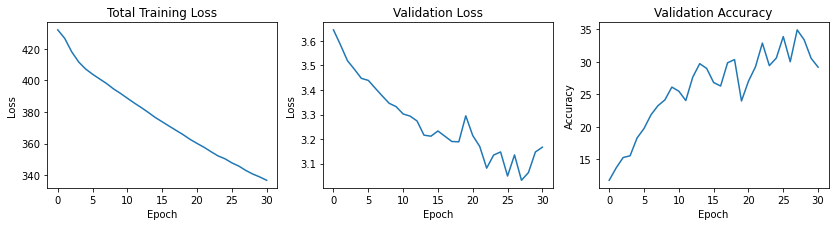

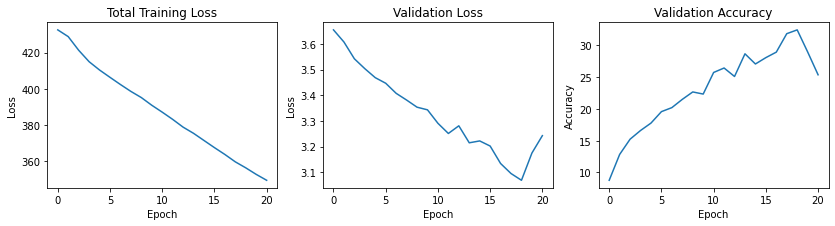

In [14]:
allModelNames_1hl = []
print('Model with one Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='sigmoid',
                        epochs = 30, batch_size = 16, learning_rate=0.005)
save_model(weights, biases, 'model_1hl_sigmoid_16bs_005lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005 ',
                      'model_1hl_sigmoid_16bs_005lr'])

print('Model with one Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='tanh',
                        epochs = 30, batch_size = 16, learning_rate=0.005)
save_model(weights, biases, 'model_1hl_tanh_16bs_005lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005 ',
                      'model_1hl_tanh_16bs_005lr'])

print('Model with one Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='ReLU',
                        epochs = 30, batch_size = 16, learning_rate=0.005)
save_model(weights, biases, 'model_1hl_relu_16bs_005lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.005 ',
                      'model_1hl_relu_16bs_005lr'])

print('Model with one Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='sigmoid',
                        epochs = 30, batch_size = 64, learning_rate=0.005)
save_model(weights, biases, 'model_1hl_sigmoid_64bs_005lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.005 ',
                      'model_1hl_sigmoid_64bs_005lr'])

print('Model with one Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.005' )
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='tanh',
                        epochs = 30, batch_size = 64, learning_rate=0.005)
save_model(weights, biases, 'model_1hl_tanh_64bs_005lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.005 ',
                      'model_1hl_tanh_64bs_005lr'])
      
print('Model with one Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='ReLU',
                        epochs = 30, batch_size = 64, learning_rate=0.005)
save_model(weights, biases, 'model_1hl_relu_64bs_005lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.005 ',
                      'model_1hl_relu_64bs_005lr'])

print('Model with one Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='sigmoid',
                        epochs = 30, batch_size = 128, learning_rate=0.005)
save_model(weights, biases, 'model_1hl_sigmoid_128bs_005lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.005 ',
                      'model_1hl_sigmoid_128bs_005lr'])

print('Model with one Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='tanh',
                        epochs = 30, batch_size = 128, learning_rate=0.005)
save_model(weights, biases, 'model_1hl_tanh_128bs_005lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.005 ',
                      'model_1hl_tanh_128bs_005lr'])

print('Model with one Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='ReLU',
                        epochs = 30, batch_size = 128, learning_rate=0.005)
save_model(weights, biases, 'model_1hl_relu_128bs_005lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.005 ',
                      'model_1hl_relu_128bs_005lr'])

print('Model with one Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='sigmoid',
                        epochs = 30, batch_size = 16, learning_rate=0.02)
save_model(weights, biases, 'model_1hl_sigmoid_16bs_02lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.02 ',
                      'model_1hl_sigmoid_16bs_02lr'])

print('Model with one Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='tanh',
                        epochs = 30, batch_size = 16, learning_rate=0.02)
save_model(weights, biases, 'model_1hl_tanh_16bs_02lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.02 ',
                      'model_1hl_tanh_16bs_02lr'])

print('Model with one Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='ReLU',
                        epochs = 30, batch_size = 16, learning_rate=0.02)
save_model(weights, biases, 'model_1hl_relu_16bs_02lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 ',
                      'model_1hl_relu_16bs_02lr'])

print('Model with one Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='sigmoid',
                        epochs = 30, batch_size = 64, learning_rate=0.02)
save_model(weights, biases, 'model_1hl_sigmoid_64bs_02lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.02 ',
                      'model_1hl_sigmoid_64bs_02lr'])

print('Model with one Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='tanh',
                        epochs = 30, batch_size = 64, learning_rate=0.02)
save_model(weights, biases, 'model_1hl_tanh_64bs_02lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.02 ',
                      'model_1hl_tanh_64bs_02lr'])

print('Model with one Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='ReLU',
                        epochs = 30, batch_size = 64, learning_rate=0.02)
save_model(weights, biases, 'model_1hl_relu_64bs_02lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.02 ',
                      'model_1hl_relu_64bs_02lr'])

print('Model with one Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='sigmoid',
                        epochs = 30, batch_size = 128, learning_rate=0.02)
save_model(weights, biases, 'model_1hl_sigmoid_128bs_02lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.02 ',
                      'model_1hl_sigmoid_128bs_02lr'])

print('Model with one Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.02')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='tanh',
                        epochs = 30, batch_size = 128, learning_rate=0.02)
save_model(weights, biases, 'model_1hl_tanh_128bs_02lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.02',
                      'model_1hl_tanh_128bs_02lr'])

print('Model with one Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_1,  activation_function='ReLU',
                        epochs = 30, batch_size = 128, learning_rate=0.02)
save_model(weights, biases, 'model_1hl_relu_128bs_02lr')
allModelNames_1hl.append(['Model with one Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.02 ',
                      'model_1hl_relu_128bs_02lr'])

print('Each models Total Training Loss, Validation Loss and Validation Accuracy plots respectively \n')

Model with two Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005
Training begins...
Epoch 0: Total Training Loss = 3447.693 , Validation Loss = 3.675 , Validation Accuracy = 6.667
            
Epoch 10: Total Training Loss = 3447.398 , Validation Loss = 3.676 , Validation Accuracy = 6.667
            
Epoch 20: Total Training Loss = 3447.852 , Validation Loss = 3.675 , Validation Accuracy = 6.667
            
Epoch 30: Total Training Loss = 3447.606 , Validation Loss = 3.674 , Validation Accuracy = 6.667
            
Training done in 196.828 seconds 

Model with two Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005
Training begins...
Epoch 0: Total Training Loss = 3446.080 , Validation Loss = 3.673 , Validation Accuracy = 8.833
            
Epoch 10: Total Training Loss = 3241.950 , Validation Loss = 3.450 , Validation Accuracy = 16.500
            
Epoch 20: Total Training Loss = 3062.373 , Validation Loss = 3.317 , Validation Acc

Epoch 0: Total Training Loss = 433.664 , Validation Loss = 3.674 , Validation Accuracy = 6.667
            
Epoch 10: Total Training Loss = 433.640 , Validation Loss = 3.674 , Validation Accuracy = 6.667
            
Epoch 20: Total Training Loss = 433.628 , Validation Loss = 3.674 , Validation Accuracy = 6.667
            
Epoch 30: Total Training Loss = 433.641 , Validation Loss = 3.674 , Validation Accuracy = 6.667
            
Training done in 47.172 seconds 

Model with two Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.02
Training begins...
Epoch 0: Total Training Loss = 433.524 , Validation Loss = 3.674 , Validation Accuracy = 9.133
            
Epoch 10: Total Training Loss = 430.461 , Validation Loss = 3.638 , Validation Accuracy = 13.433
            
Epoch 20: Total Training Loss = 407.077 , Validation Loss = 3.458 , Validation Accuracy = 16.833
            
Epoch 30: Total Training Loss = 398.886 , Validation Loss = 3.387 , Validation Accuracy = 19.

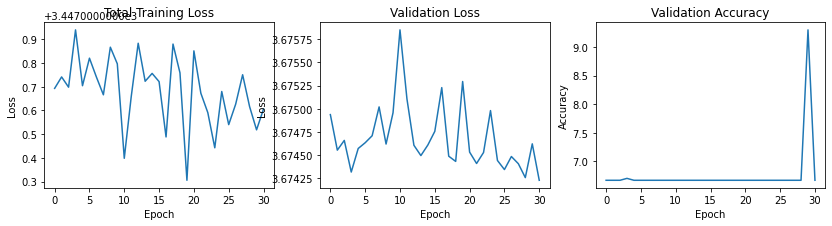

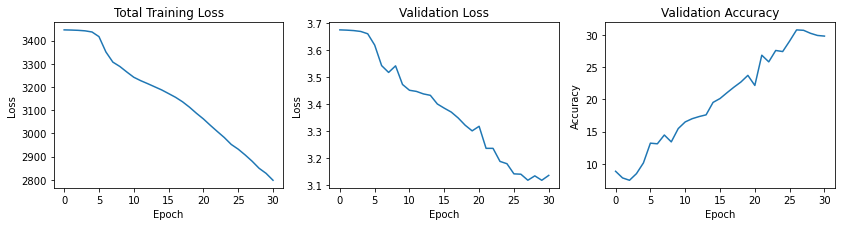

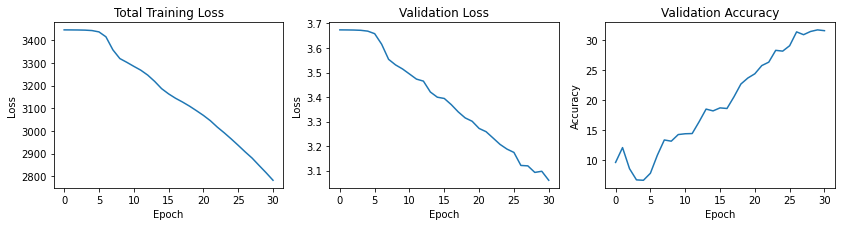

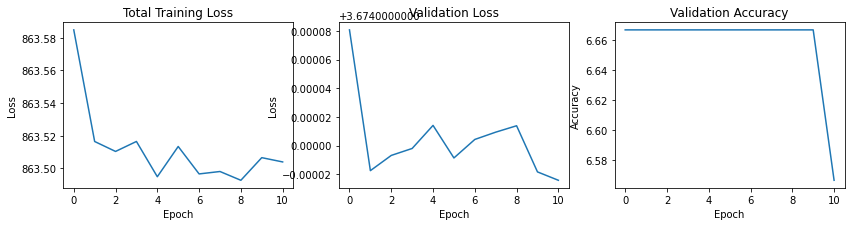

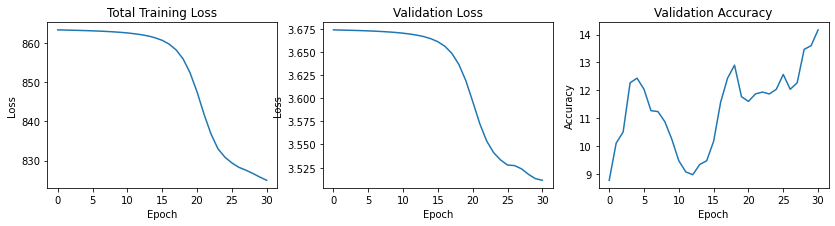

...

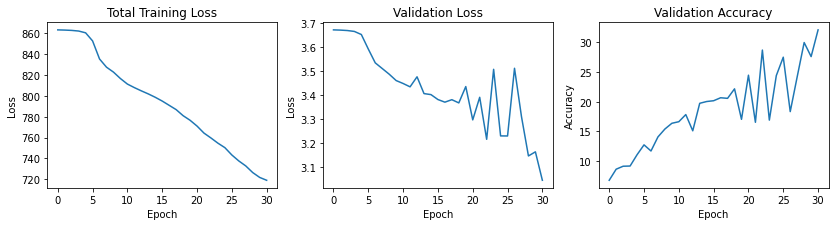

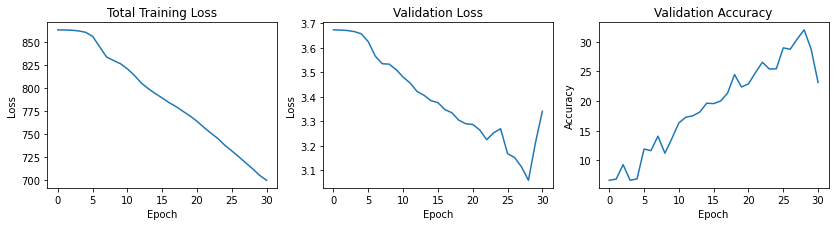

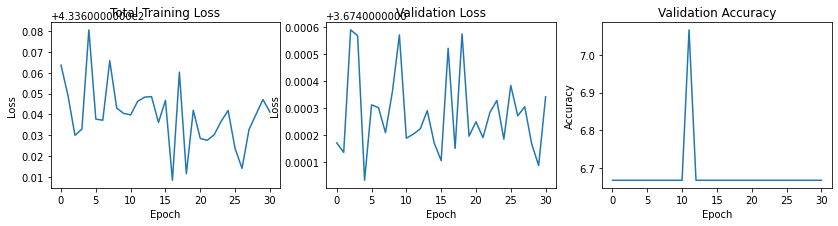

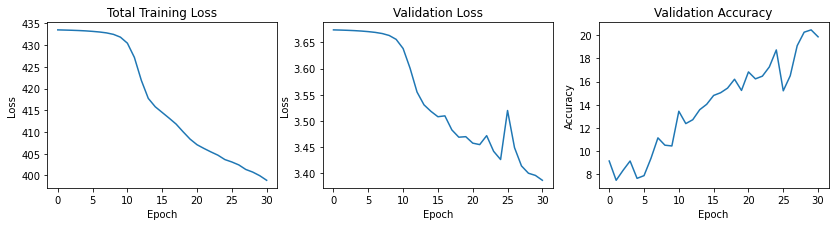

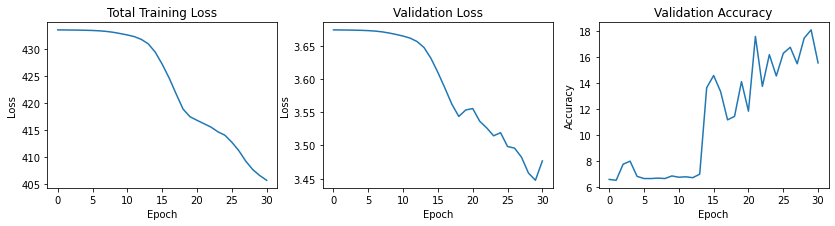

In [15]:
allModelNames_2hl = []
print('Model with two Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='sigmoid',
                        epochs = 30, batch_size = 16, learning_rate=0.005)
save_model(weights, biases, 'model_2hl_sigmoid_16bs_005lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005 ',
                      'model_2hl_sigmoid_16bs_005lr'])

print('Model with two Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='tanh',
                        epochs = 30, batch_size = 16, learning_rate=0.005)
save_model(weights, biases, 'model_2hl_tanh_16bs_005lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005 ',
                      'model_2hl_tanh_16bs_005lr'])

print('Model with two Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='ReLU',
                        epochs = 30, batch_size = 16, learning_rate=0.005)
save_model(weights, biases, 'model_2hl_relu_16bs_005lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.005 ',
                      'model_2hl_relu_16bs_005lr'])

print('Model with two Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='sigmoid',
                        epochs = 30, batch_size = 64, learning_rate=0.005)
save_model(weights, biases, 'model_2hl_sigmoid_64bs_005lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.005 ',
                      'model_2hl_sigmoid_64bs_005lr'])

print('Model with two Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.005' )
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='tanh',
                        epochs = 30, batch_size = 64, learning_rate=0.005)
save_model(weights, biases, 'model_2hl_tanh_64bs_005lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.005 ',
                      'model_2hl_tanh_64bs_005lr'])
      
print('Model with two Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='ReLU',
                        epochs = 30, batch_size = 64, learning_rate=0.005)
save_model(weights, biases, 'model_2hl_relu_64bs_005lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.005 ',
                      'model_2hl_relu_64bs_005lr'])

print('Model with two Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='sigmoid',
                        epochs = 30, batch_size = 128, learning_rate=0.005)
save_model(weights, biases, 'model_2hl_sigmoid_128bs_005lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.005 ',
                      'model_2hl_sigmoid_128bs_005lr'])

print('Model with two Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='tanh',
                        epochs = 30, batch_size = 128, learning_rate=0.005)
save_model(weights, biases, 'model_2hl_tanh_128bs_005lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.005 ',
                      'model_2hl_tanh_128bs_005lr'])

print('Model with two Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.005 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='ReLU',
                        epochs = 30, batch_size = 128, learning_rate=0.005)
save_model(weights, biases, 'model_2hl_relu_128bs_005lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.005 ',
                      'model_2hl_relu_128bs_005lr'])

print('Model with two Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='sigmoid',
                        epochs = 30, batch_size = 16, learning_rate=0.02)
save_model(weights, biases, 'model_2hl_sigmoid_16bs_02lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.02 ',
                      'model_2hl_sigmoid_16bs_02lr'])

print('Model with two Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='tanh',
                        epochs = 30, batch_size = 16, learning_rate=0.02)
save_model(weights, biases, 'model_2hl_tanh_16bs_02lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.02 ',
                      'model_2hl_tanh_16bs_02lr'])

print('Model with two Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='ReLU',
                        epochs = 30, batch_size = 16, learning_rate=0.02)
save_model(weights, biases, 'model_2hl_relu_16bs_02lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 ',
                      'model_2hl_relu_16bs_02lr'])

print('Model with two Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='sigmoid',
                        epochs = 30, batch_size = 64, learning_rate=0.02)
save_model(weights, biases, 'model_2hl_sigmoid_64bs_02lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.02 ',
                      'model_2hl_sigmoid_64bs_02lr'])

print('Model with two Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='tanh',
                        epochs = 30, batch_size = 64, learning_rate=0.02)
save_model(weights, biases, 'model_2hl_tanh_64bs_02lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.02 ',
                      'model_2hl_tanh_64bs_02lr'])

print('Model with two Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='ReLU',
                        epochs = 30, batch_size = 64, learning_rate=0.02)
save_model(weights, biases, 'model_2hl_relu_64bs_02lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.02 ',
                      'model_2hl_relu_64bs_02lr'])

print('Model with two Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='sigmoid',
                        epochs = 30, batch_size = 128, learning_rate=0.02)
save_model(weights, biases, 'model_2hl_sigmoid_128bs_02lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.02 ',
                      'model_2hl_sigmoid_128bs_02lr'])

print('Model with two Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.02')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='tanh',
                        epochs = 30, batch_size = 128, learning_rate=0.02)
save_model(weights, biases, 'model_2hl_tanh_128bs_02lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.02',
                      'model_2hl_tanh_128bs_02lr'])

print('Model with two Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train, y_train, x_validation, y_validation, layer_dims_2,  activation_function='ReLU',
                        epochs = 30, batch_size = 128, learning_rate=0.02)
save_model(weights, biases, 'model_2hl_relu_128bs_02lr')
allModelNames_2hl.append(['Model with two Hidden Layer, batch_size=128, activation function= ReLU, learning rate=0.02 ',
                      'model_2hl_relu_128bs_02lr'])

print('Each models Total Training Loss, Validation Loss and Validation Accuracy plots respectively \n')

<h1  style="color:#805b36 ;background:#FFD8B2"> Accuracies of Trained Models on Test Set</h1>

In [16]:
#prints all different models accuracies on Test Data 
#Also , returns best model which has the highest accuracy on test data
def getModelsAccuracy(allModelNames):
    bestModelAcc= 0
    bestModelName = ''
    for eachModel in allModelNames:
        modelTitle, model = eachModel
        weights , biases = load_model(model)
        forward_results_test, predictions , labels = predict(x_test, y_test, weights, biases, 
                                                             activation_function = model.split('_')[2])
        print(modelTitle)
        acc = accuracy_score(predictions,labels)*100 
        if acc>bestModelAcc:
            bestModelAcc = acc
            bestModelName = model
        print("Test Data Accuracy : {:.3f}".format(acc))
    return bestModelName

In [17]:
#Models with No hidden layer
bestModel_0hl = getModelsAccuracy(allModelNames_0hl)

Model with No Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005 
Test Data Accuracy : 36.600
Model with No Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005 
Test Data Accuracy : 36.500
Model with No Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.005 
Test Data Accuracy : 35.367
Model with No Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.005 
Test Data Accuracy : 32.300
Model with No Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.005 
Test Data Accuracy : 32.200
Model with No Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.005 
Test Data Accuracy : 33.100
Model with No Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.005 
Test Data Accuracy : 30.800
Model with No Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.005 
Test Data Accuracy : 31.200
Model with No Hidden Layer, batch_siz

In [18]:
#Models with  1-hidden layer
bestModel_1hl = getModelsAccuracy(allModelNames_1hl)

Model with one Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005 
Test Data Accuracy : 14.767
Model with one Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005 
Test Data Accuracy : 44.600
Model with one Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.005 
Test Data Accuracy : 43.133
Model with one Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.005 
Test Data Accuracy : 16.600
Model with one Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.005 
Test Data Accuracy : 29.833
Model with one Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.005 
Test Data Accuracy : 31.067
Model with one Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.005 
Test Data Accuracy : 18.400
Model with one Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.005 
Test Data Accuracy : 22.400
Model with one Hidden Layer, 

In [19]:
#Models with 2-hidden layer
bestModel_2hl = getModelsAccuracy(allModelNames_2hl)

Model with two Hidden Layer, batch_size=16, activation function= Sigmoid, learning rate=0.005 
Test Data Accuracy : 6.667
Model with two Hidden Layer, batch_size=16, activation function= tanh, learning rate=0.005 
Test Data Accuracy : 28.700
Model with two Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.005 
Test Data Accuracy : 30.633
Model with two Hidden Layer, batch_size=64, activation function= Sigmoid, learning rate=0.005 
Test Data Accuracy : 6.667
Model with two Hidden Layer, batch_size=64, activation function= tanh, learning rate=0.005 
Test Data Accuracy : 13.367
Model with two Hidden Layer, batch_size=64, activation function= ReLU, learning rate=0.005 
Test Data Accuracy : 7.300
Model with two Hidden Layer, batch_size=128, activation function= Sigmoid, learning rate=0.005 
Test Data Accuracy : 7.133
Model with two Hidden Layer, batch_size=128, activation function= tanh, learning rate=0.005 
Test Data Accuracy : 7.433
Model with two Hidden Layer, batch

<h1  style="color:#805b36 ;background:#FFD8B2"> Best Models Parameters For Each Model  And Analysis with Confusion Matrix and Classification Report</h1>

In [64]:
def anaylsis_for_model(model, x_test, y_test):
    print("""Best Model Parameters with {} Hidden Layers is:
        Batch Size : {}  , Learning Rate :0.{} , Activation Function : {} """.format(
         model.split("_")[1][:-2], model.split("_")[3][:-2] , model.split("_")[4][:-2], model.split("_")[2]))
    
    weights , biases = load_model(model)
    forward_results_test, predictions , labels = predict(x_test, y_test, weights, biases, 
                                                                 activation_function = model.split('_')[2])
    cr = classification_report(predictions, labels, target_names=list(class_dict.keys()))
    print("\n Classification Report ")
    print(cr)
    
    cm = confusion_matrix(predictions, labels)
    plt.rc('figure', figsize=(16,16))
    print("Confusion Matrix ")
    ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=list(class_dict.keys())).plot(cmap="YlGn")
    print("Accuracy : {:.3f} ".format(accuracy_score(predictions,labels)*100))

Best Model Parameters with 0 Hidden Layers is:
        Batch Size : 16  , Learning Rate :0.005 , Activation Function : sigmoid 

 Classification Report 
              precision    recall  f1-score   support

        Bean       0.27      0.43      0.33       122
Bitter_Gourd       0.35      0.52      0.42       136
Bottle_Gourd       0.51      0.34      0.41       295
     Brinjal       0.34      0.39      0.36       173
    Broccoli       0.24      0.46      0.32       104
     Cabbage       0.24      0.27      0.26       180
    Capsicum       0.47      0.36      0.41       261
      Carrot       0.28      0.42      0.34       135
 Cauliflower       0.40      0.36      0.37       222
    Cucumber       0.33      0.72      0.45        90
      Papaya       0.32      0.50      0.39       128
      Potato       0.39      0.55      0.46       141
     Pumpkin       0.46      0.22      0.30       412
      Radish       0.35      0.54      0.43       132
      Tomato       0.55      0.23   

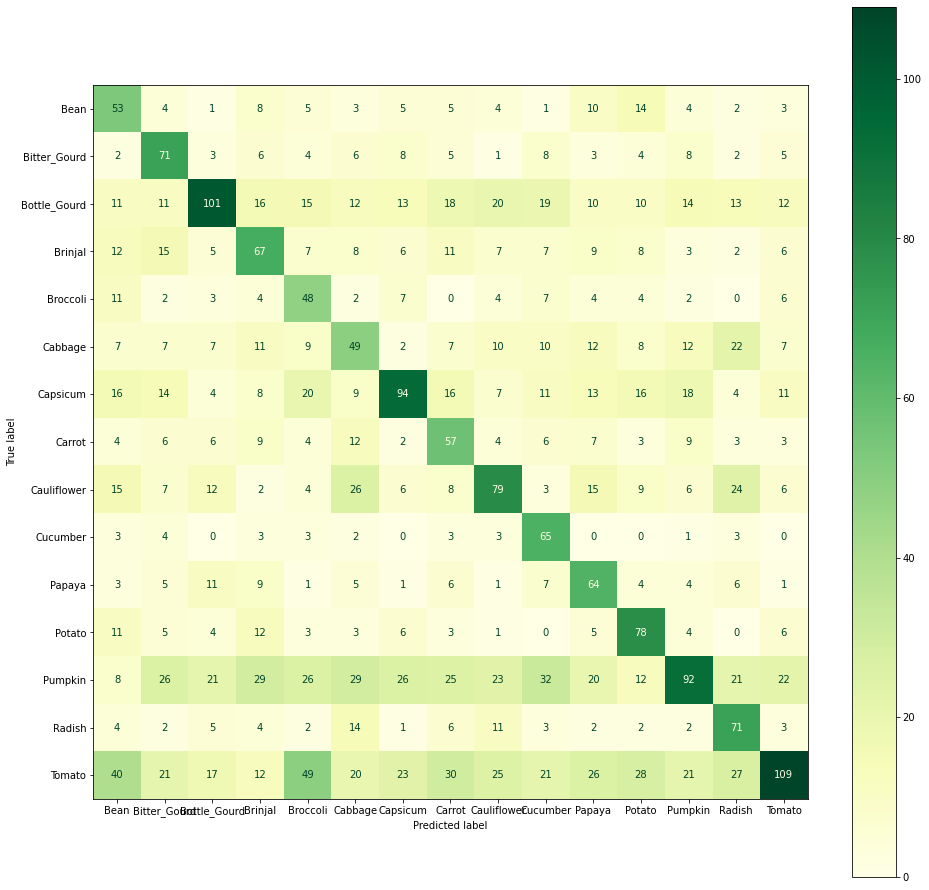

In [65]:
#Best Model with No Hidden Layer 
anaylsis_for_model(bestModel_0hl,x_test, y_test)

Best Model Parameters with 1 Hidden Layers is:
        Batch Size : 16  , Learning Rate :0.02 , Activation Function : relu 

 Classification Report 
              precision    recall  f1-score   support

        Bean       0.45      0.69      0.54       129
Bitter_Gourd       0.71      0.51      0.60       279
Bottle_Gourd       0.66      0.90      0.76       145
     Brinjal       0.80      0.33      0.47       483
    Broccoli       0.47      0.65      0.54       142
     Cabbage       0.26      0.50      0.34       101
    Capsicum       0.60      0.75      0.67       161
      Carrot       0.57      0.82      0.67       139
 Cauliflower       0.74      0.27      0.40       542
    Cucumber       0.58      0.67      0.62       172
      Papaya       0.42      0.83      0.56       102
      Potato       0.57      0.50      0.53       230
     Pumpkin       0.30      0.85      0.44        71
      Radish       0.47      0.73      0.58       130
      Tomato       0.34      0.39      0

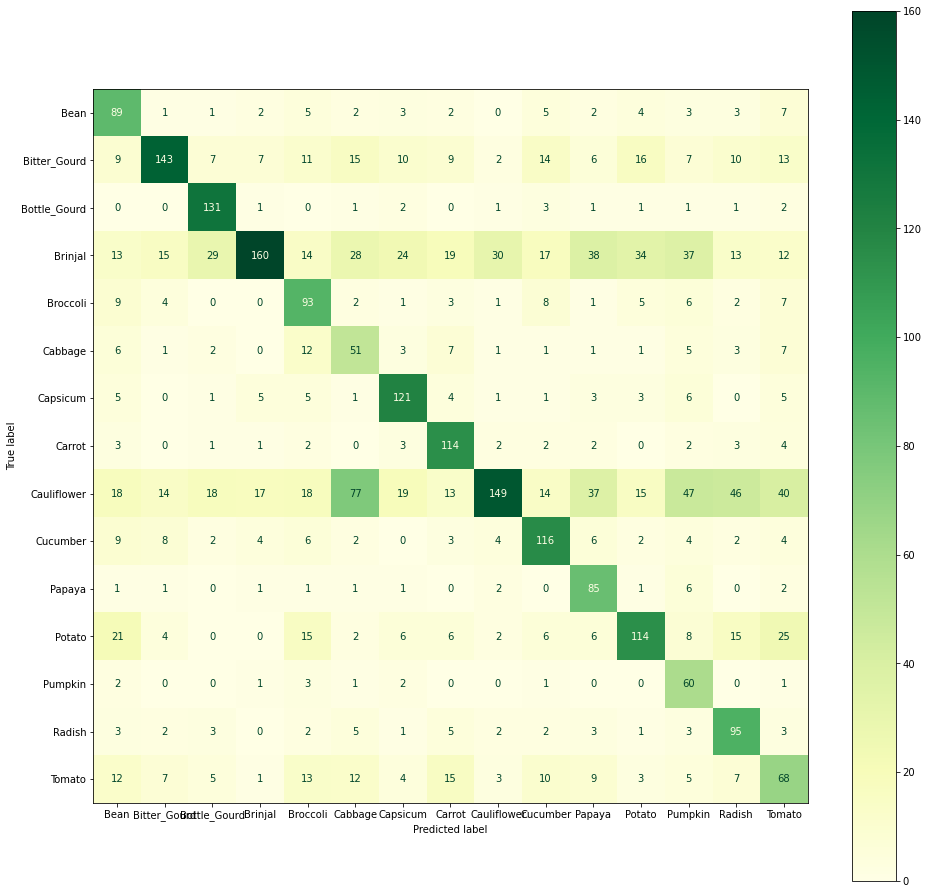

In [66]:
#Best Model with 1-Hidden Layer 
anaylsis_for_model(bestModel_1hl,x_test, y_test)

Best Model Parameters with 2 Hidden Layers is:
        Batch Size : 16  , Learning Rate :0.02 , Activation Function : relu 

 Classification Report 
              precision    recall  f1-score   support

        Bean       0.65      0.51      0.57       254
Bitter_Gourd       0.57      0.80      0.67       142
Bottle_Gourd       0.71      0.88      0.79       163
     Brinjal       0.49      0.77      0.60       128
    Broccoli       0.66      0.58      0.62       229
     Cabbage       0.55      0.43      0.48       256
    Capsicum       0.68      0.77      0.72       176
      Carrot       0.73      0.64      0.68       227
 Cauliflower       0.41      0.73      0.53       113
    Cucumber       0.63      0.72      0.67       174
      Papaya       0.67      0.75      0.71       179
      Potato       0.71      0.52      0.60       273
     Pumpkin       0.53      0.75      0.62       141
      Radish       0.86      0.43      0.57       403
      Tomato       0.31      0.44      0

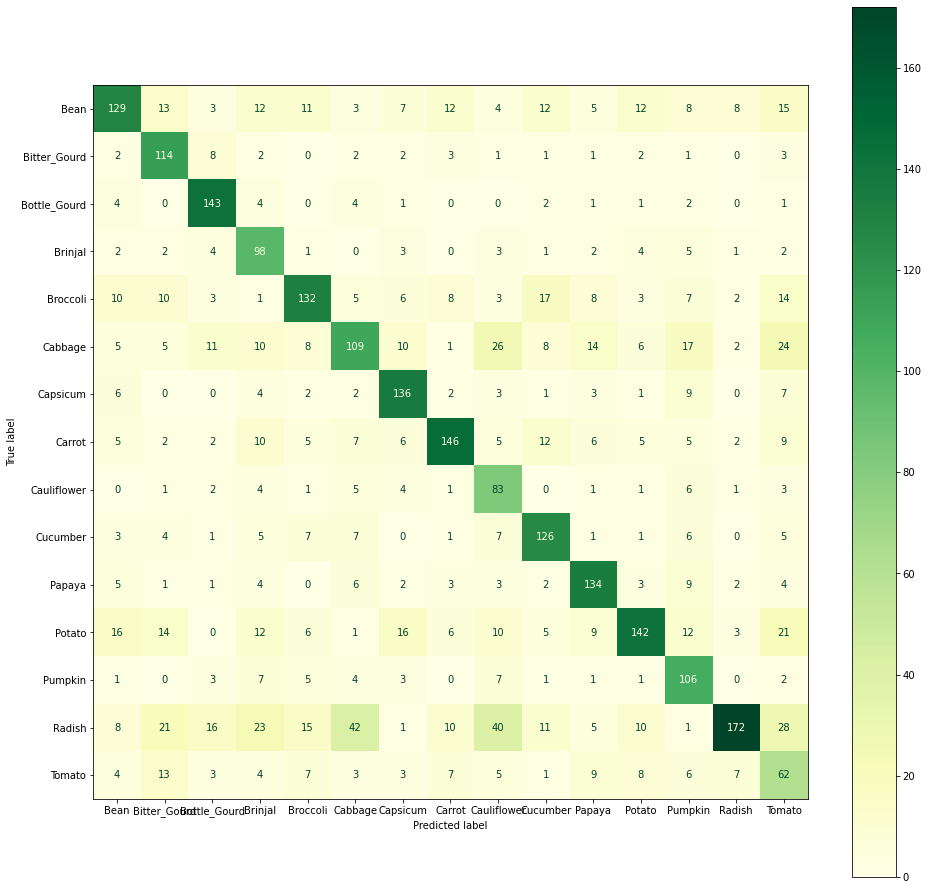

In [67]:
#Best Model with 2-Hidden Layer 
anaylsis_for_model(bestModel_2hl,x_test, y_test)

<h1  style="color:#805b36 ;background:#FFD8B2"> Visualizing Weight Matrixes of Best Model with No Hidden Layer </h1>

In [24]:
#for plotting weight matrixes
def plot_weights(weigs, p_x, p_y, numb_of_neurons, resize_shape, output_layer=False):
    fig = plt.figure(figsize=(16, 16))
    for i in range(numb_of_neurons):
        fig.add_subplot(p_x , p_y , i+1)
        data = weigs[i]
        img = data - np.min(data);
        img = img / max(img);
        plt.axis('off')
        plt.imshow(img.reshape(resize_shape), cmap='gray')
        if output_layer:
            plt.title(reverse_class_list[i])
        else:
            plt.title('Neuron {}'.format(i+1))

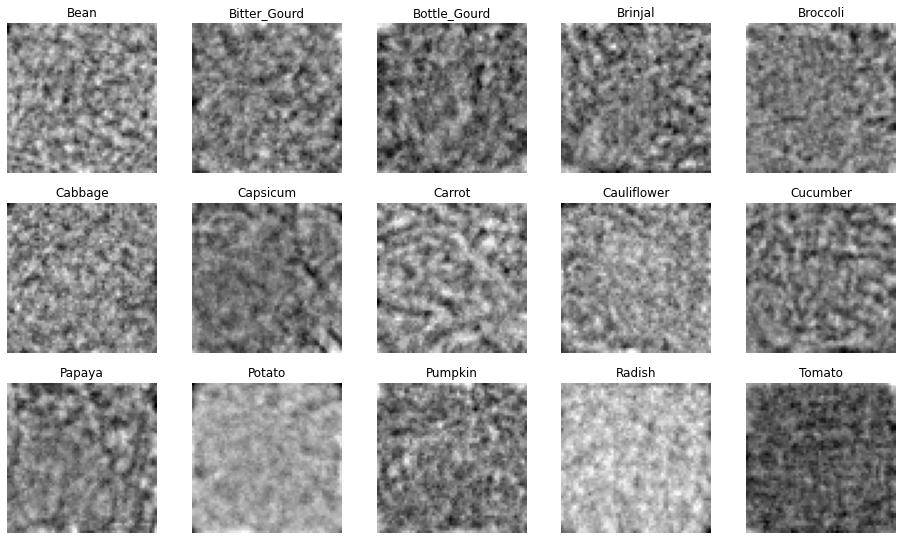

In [25]:
#best models weights visualization
weights, biases = load_model(bestModel_0hl)
#First Layer Weights
plot_weights(weights[0], 5,5, 15 , (60,60), True)

<h1  style="color:#805b36 ;background:#FFD8B2"> Visualizing Weight Matrixes of Best Model with 1-Hidden Layer </h1>

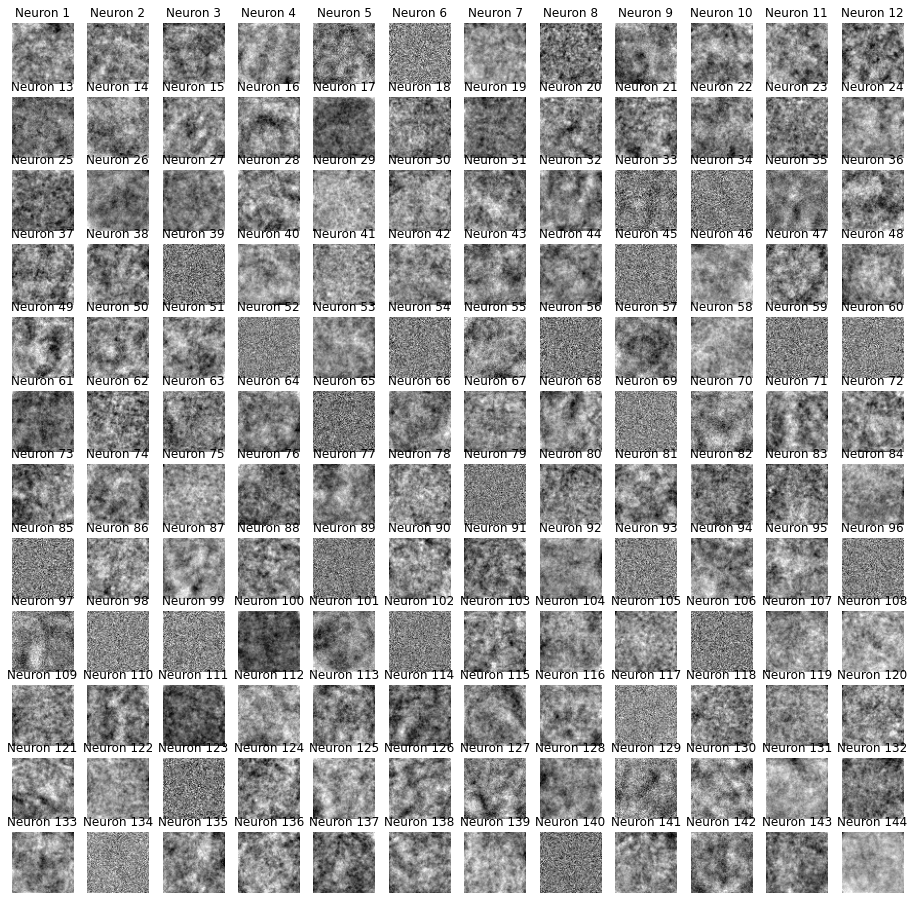

In [26]:
#1st hidden layer weights
weights, biases = load_model(bestModel_1hl)
plot_weights(weights[0], 12,12, 144 , (60,60), False)

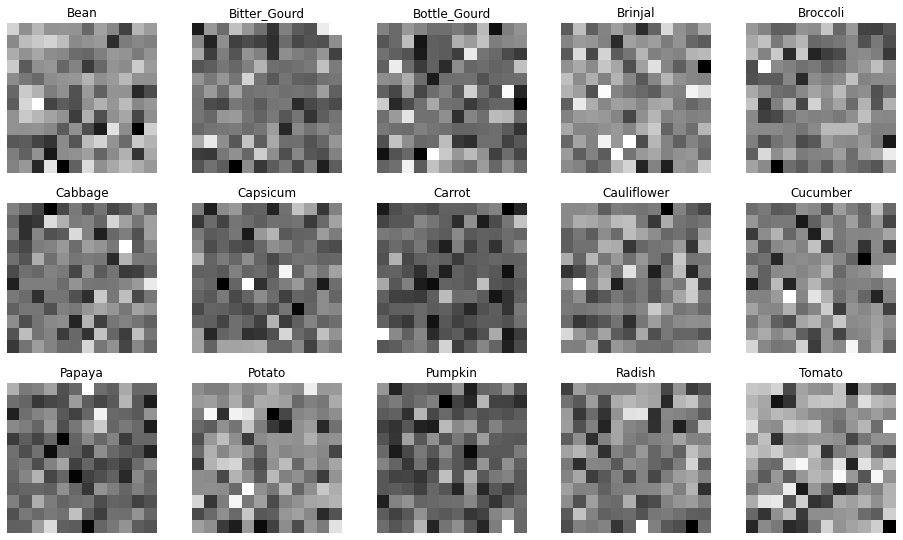

In [27]:
#output layer weights
plot_weights(weights[1], 5,5, 15 , (12,12), True)

<h1  style="color:#805b36 ;background:#FFD8B2"> Visualizing Weight Matrixes of Best Model with 2-Hidden Layer </h1>

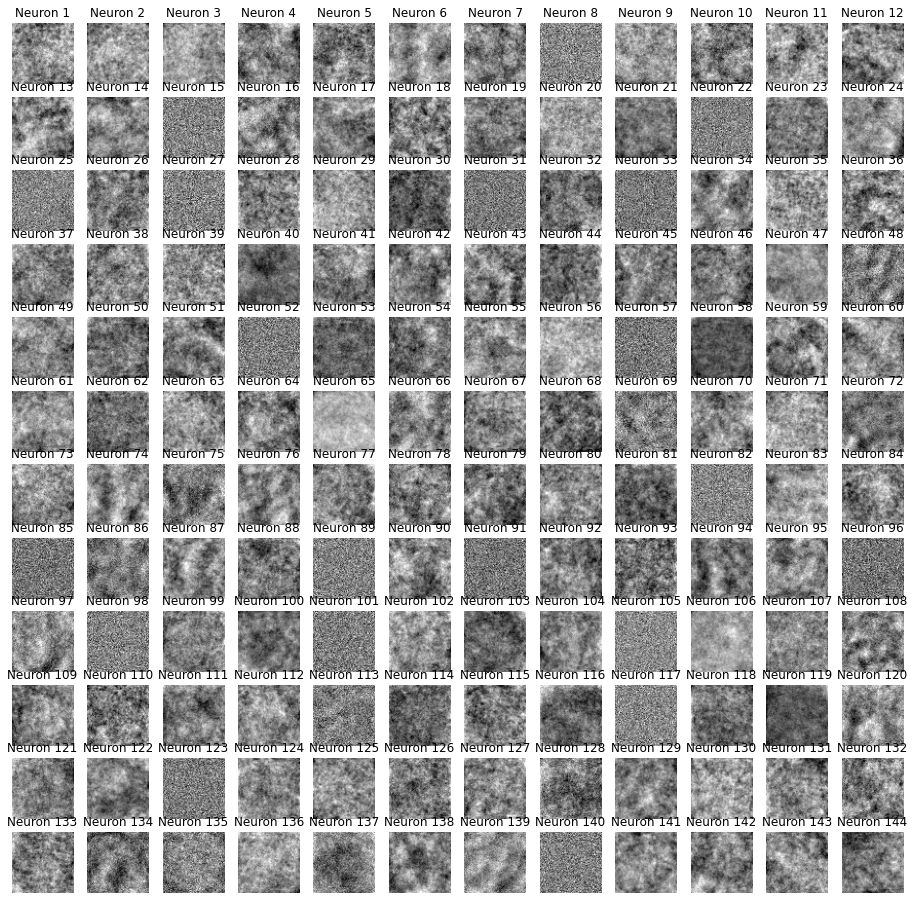

In [28]:
weights, biases = load_model(bestModel_2hl)
#1st hidden layer weights
plot_weights(weights[0], 12,12, 144 , (60,60), False)

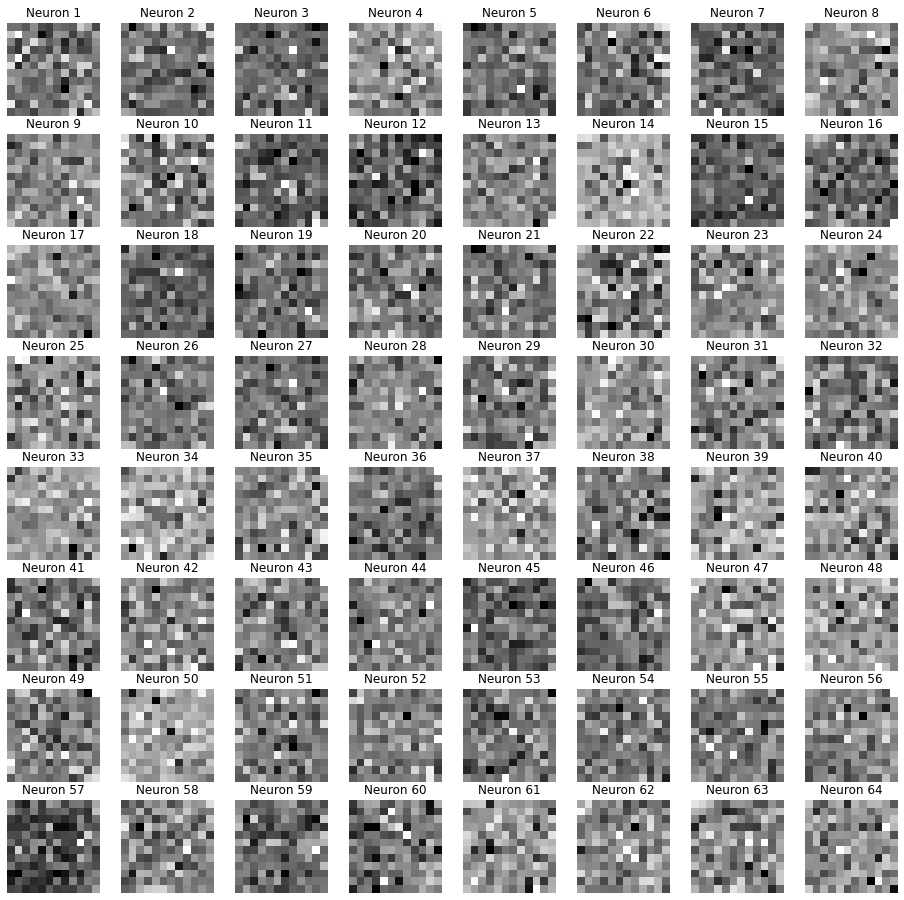

In [29]:
#2nd hidden layer weights
plot_weights(weights[1], 8,8, 64 , (12,12), False)

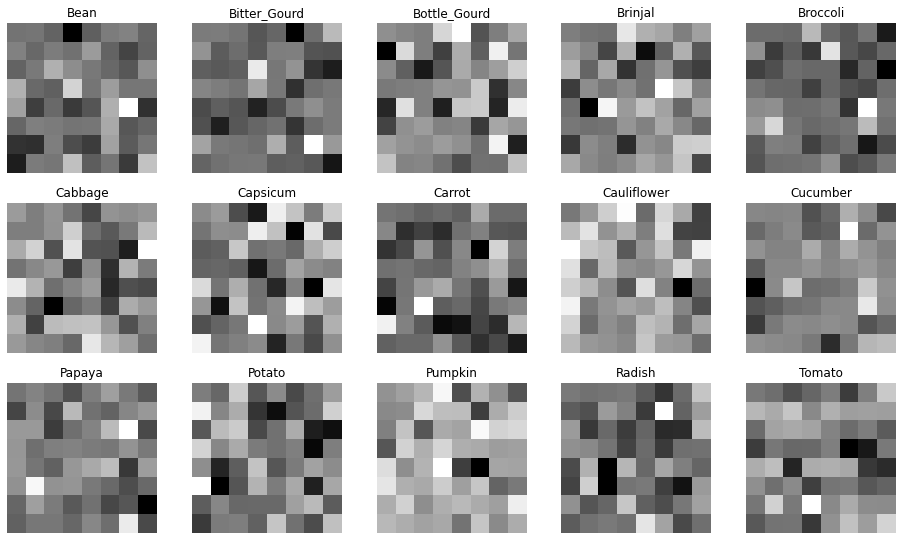

In [30]:
#output layer weights
plot_weights(weights[2], 5,5, 15 , (8,8), True)

In [33]:
def printForHtmlTable(allModelNames):
    for eachModel in allModelNames:
        modelTitle, model = eachModel
        weights , biases = load_model(model)
        forward_results_test, predictions , labels = predict(x_test, y_test, weights, biases, 
                                                            activation_function = model.split('_')[2])
        acc = accuracy_score(predictions,labels)*100 
        print('<td style="border: 1px solid black;" colspan="2"> {:.3f} </td>'.format(acc))
# printForHtmlTable(allModelNames_0hl)
# print()
# printForHtmlTable(allModelNames_1hl)
# print()
# printForHtmlTable(allModelNames_2hl)


<h1 style=" font-size: 40px; font-weight: 600;text-transform:uppercase; color:#694382; background: #ECCFFF;">Analysis Of Part 1</h1>
<h1 style="text-transform:uppercase;color:#c63737 ; background:#FFCDD2"> Models With No Hidden Layer - Accuracy Table On Test Set </h1>
<table style="width:100%;border: 1px solid black;">
  <tr style="border: 1px solid black;">
     <th style="border: 1px solid black;" colspan="3">Learning Rate</th>
    <th style="border: 1px solid black;" colspan="18">0.005</th>
    <th style="border: 1px solid black;" colspan="18"> 0.02</th> 
    
  </tr>
  <tr style="border: 1px solid black;">
      <td style="border: 1px solid black;" colspan="3">Batch Size </td>
    <td style="border: 1px solid black;" colspan="6"> 16</td>
    <td style="border: 1px solid black;"  colspan="6">64</td>
    <td style="border: 1px solid black;" colspan="6"> 128</td>
    <td style="border: 1px solid black;" colspan="6"> 16</td>
    <td style="border: 1px solid black;" colspan="6"> 64</td>
    <td style="border: 1px solid black;" colspan="6">128</td>
    
  </tr>
  <tr style="border: 1px solid black;">
     <td style="border: 1px solid black;" colspan="3">Activation Function</td>
    <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
   
  </tr>

  <tr style="border: 1px solid black;">
      <td style="border: 1px solid black;" colspan="3">Accuracy </td>
<td style="border: 1px solid black;" colspan="2"> 36.600 </td>
<td style="border: 1px solid black;" colspan="2"> 36.500 </td>
<td style="border: 1px solid black;" colspan="2"> 35.367 </td>
<td style="border: 1px solid black;" colspan="2"> 32.300 </td>
<td style="border: 1px solid black;" colspan="2"> 32.200 </td>
<td style="border: 1px solid black;" colspan="2"> 33.100 </td>
<td style="border: 1px solid black;" colspan="2"> 30.800 </td>
<td style="border: 1px solid black;" colspan="2"> 31.200 </td>
<td style="border: 1px solid black;" colspan="2"> 31.533 </td>
<td style="border: 1px solid black;" colspan="2"> 19.467 </td>
<td style="border: 1px solid black;" colspan="2"> 31.100 </td>
<td style="border: 1px solid black;" colspan="2"> 16.800 </td>
<td style="border: 1px solid black;" colspan="2"> 28.033 </td>
<td style="border: 1px solid black;" colspan="2"> 34.300 </td>
<td style="border: 1px solid black;" colspan="2"> 26.900 </td>
<td style="border: 1px solid black;" colspan="2"> 29.600 </td>
<td style="border: 1px solid black;" colspan="2"> 29.200 </td>
<td style="border: 1px solid black;" colspan="2"> 29.267 </td>
   
  </tr>
    
</table>

As we can see on the table , smaller learning rate gives slightly  better performances for No-hidden layer model. On the other hand , choosing batch size as 64 gives better accuracy compared to other batch sizes. There is not much difference between activation functions since we don't use any hidden layer on this model. Best models accuracy is %36.600 and its a bit bad. The reasons behind this can be gray-level images and not enough neurons since no hidden layers applied. Adding hidden layers may increase the accuracies.

<h1 style="text-transform:uppercase;color:#c63737 ; background:#FFCDD2"> Models With One Hidden Layer - Accuracy Table On Test Set </h1>
<table style="width:100%;border: 1px solid black;">
  <tr style="border: 1px solid black;">
     <th style="border: 1px solid black;" colspan="3">Learning Rate</th>
    <th style="border: 1px solid black;" colspan="18">0.005</th>
    <th style="border: 1px solid black;" colspan="18"> 0.02</th> 
    
  </tr>
  <tr style="border: 1px solid black;">
      <td style="border: 1px solid black;" colspan="3">Batch Size </td>
    <td style="border: 1px solid black;" colspan="6"> 16</td>
    <td style="border: 1px solid black;"  colspan="6">64</td>
    <td style="border: 1px solid black;" colspan="6"> 128</td>
    <td style="border: 1px solid black;" colspan="6"> 16</td>
    <td style="border: 1px solid black;" colspan="6"> 64</td>
    <td style="border: 1px solid black;" colspan="6">128</td>
    
  </tr>
  <tr style="border: 1px solid black;">
     <td style="border: 1px solid black;" colspan="3">Activation Function</td>
    <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
   
  </tr>

  <tr style="border: 1px solid black;">
      <td style="border: 1px solid black;" colspan="3">Accuracy </td>
<td style="border: 1px solid black;" colspan="2"> 14.767 </td>
<td style="border: 1px solid black;" colspan="2"> 44.600 </td>
<td style="border: 1px solid black;" colspan="2"> 43.133 </td>
<td style="border: 1px solid black;" colspan="2"> 16.600 </td>
<td style="border: 1px solid black;" colspan="2"> 29.833 </td>
<td style="border: 1px solid black;" colspan="2"> 31.067 </td>
<td style="border: 1px solid black;" colspan="2"> 18.400 </td>
<td style="border: 1px solid black;" colspan="2"> 22.400 </td>
<td style="border: 1px solid black;" colspan="2"> 23.433 </td>
<td style="border: 1px solid black;" colspan="2"> 13.833 </td>
<td style="border: 1px solid black;" colspan="2"> 47.467 </td>
<td style="border: 1px solid black;" colspan="2"> 52.967 </td>
<td style="border: 1px solid black;" colspan="2"> 16.267 </td>
<td style="border: 1px solid black;" colspan="2"> 42.367 </td>
<td style="border: 1px solid black;" colspan="2"> 43.233 </td>
<td style="border: 1px solid black;" colspan="2"> 17.300 </td>
<td style="border: 1px solid black;" colspan="2"> 28.333 </td>
<td style="border: 1px solid black;" colspan="2"> 28.633 </td>

  </tr>
    
</table>

In this table ,we can clearly see that  choosing learning rate bigger gives slightly  better performances for 1-hidden layer model. Besides , smaller batch size gives better accuracy compared to other batch sizes . Althrough accuracies of tanh and ReLU functions are really close, Sigmoid function gives really bad performance for 1-layer model. Best models accuracy is %52.967 and its pretty good compared to 0-Hidden Layer model . 

<h1 style="text-transform:uppercase;color:#c63737 ; background:#FFCDD2"> Models With Two Hidden Layer - Accuracy Table On Test Set </h1>
<table style="width:100%;border: 1px solid black;">
  <tr style="border: 1px solid black;">
     <th style="border: 1px solid black;" colspan="3">Learning Rate</th>
    <th style="border: 1px solid black;" colspan="18">0.005</th>
    <th style="border: 1px solid black;" colspan="18"> 0.02</th> 
    
  </tr>
  <tr style="border: 1px solid black;">
      <td style="border: 1px solid black;" colspan="3">Batch Size </td>
    <td style="border: 1px solid black;" colspan="6"> 16</td>
    <td style="border: 1px solid black;"  colspan="6">64</td>
    <td style="border: 1px solid black;" colspan="6"> 128</td>
    <td style="border: 1px solid black;" colspan="6"> 16</td>
    <td style="border: 1px solid black;" colspan="6"> 64</td>
    <td style="border: 1px solid black;" colspan="6">128</td>
    
  </tr>
  <tr style="border: 1px solid black;">
     <td style="border: 1px solid black;" colspan="3">Activation Function</td>
    <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
     <td style="border: 1px solid black;" colspan="2">Sigmoid</td>
    <td style="border: 1px solid black;" colspan="2">Tanh</td>
    <td style="border: 1px solid black;" colspan="2">ReLU</td>
   
  </tr>

  <tr style="border: 1px solid black;">
      <td style="border: 1px solid black;" colspan="3">Accuracy </td>
<td style="border: 1px solid black;" colspan="2"> 6.667 </td>
<td style="border: 1px solid black;" colspan="2"> 28.700 </td>
<td style="border: 1px solid black;" colspan="2"> 30.633 </td>
<td style="border: 1px solid black;" colspan="2"> 6.667 </td>
<td style="border: 1px solid black;" colspan="2"> 13.367 </td>
<td style="border: 1px solid black;" colspan="2"> 7.300 </td>
<td style="border: 1px solid black;" colspan="2"> 7.133 </td>
<td style="border: 1px solid black;" colspan="2"> 7.433 </td>
<td style="border: 1px solid black;" colspan="2"> 7.400 </td>
<td style="border: 1px solid black;" colspan="2"> 6.667 </td>
<td style="border: 1px solid black;" colspan="2"> 32.433 </td>
<td style="border: 1px solid black;" colspan="2"> 61.067 </td>
<td style="border: 1px solid black;" colspan="2"> 6.667 </td>
<td style="border: 1px solid black;" colspan="2"> 31.533 </td>
<td style="border: 1px solid black;" colspan="2"> 22.533 </td>
<td style="border: 1px solid black;" colspan="2"> 6.667 </td>
<td style="border: 1px solid black;" colspan="2"> 19.133 </td>
<td style="border: 1px solid black;" colspan="2"> 16.300 </td>
   
  </tr>
    
</table>

In this table, we can see that small learning rate gives really bad performance for all parameters. The reason behind this can be very slow convergence on gradient descent algorithm. Choosing learning rate bigger is a way to go. Also , increasing the batch size decreases the accuracies similiar to 1-hidden layer model. Small batch size values as 16 should be applied on models. And again we can see that sigmoid function gives terribly bad performance similiar to 1-hidden layer model. ReLU function gives really good performance compared to other activation functions. Best models accuracy is %61.067 and its quite acceptable. 


<h1 style="font-weight: 600;text-transform:uppercase; color:#c63737 ; background:#FFCDD2"> Conclusion</h1>
<li>
As we can clearly see on tables, since there is not much difference between 1-layer model and 2-layer model in terms of accuracy, we can choose hidden layer number as 1 or 2. But 0-hidden layer gives really bad performance so that at least 1 hidden layer should be applied to get higher accuracies.
</li>
<li>
Although decreasing batch size increases training time since number of forward and backward propagation increases, it also increases the accuracy . So , because it gives better performance , smaller batch sizes should be applied when training neural networks.
</li>
<li>
Finally , activation function should be selected as ReLU since it gives the best performance among them. Sigmoid function gives terribely bad results with 1 and 2 hidden layer models. It is because that the output of sigmoid saturates for a large positive or large negative number. Thus, the gradient at these regions is almost zero. During backpropagation, this local gradient is multiplied with the gradient of this gates’ output. Thus, if the local gradient is very small, it will kill the the gradient and the network will not learn. This problem is known as vanishing gradient and solved by using ReLU function. 
</li>

<li>
The reason behind that getting accuracies that not quite high  is grayscaling the images so that decreasing the number of features. Instead, we can use RGB level images to increase accuracies of models. It is a more proper approach when training neural networks for image classification.
</li>

<h1  style="color:#805b36 ;background:#FFD8B2"> Training With Best Model Parameters Using RGB-Level Images Instead of 
    Gray-Level Images </h1>

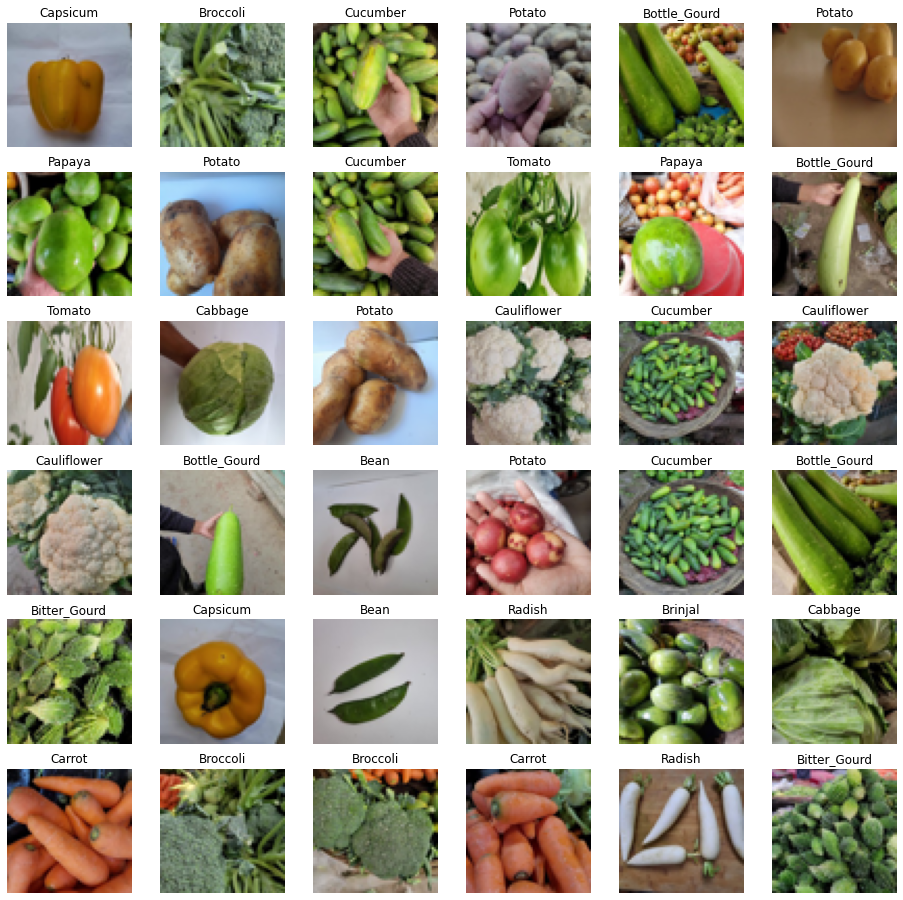

In [35]:
#reading our train , validation and test data with rgb values
x_train_rgb, y_train_rgb = read_images(trainpath, class_dict, size=(60,60), convert_gray=False)
x_validation_rgb, y_validation_rgb = read_images(validationpath, class_dict, size=(60,60), convert_gray=False)
x_test_rgb, y_test_rgb = read_images(testpath, class_dict, size=(60,60), convert_gray=False)

#shuffling train data
keys = np.array(range(x_train_rgb.shape[1]))
np.random.shuffle(keys)
x_train_rgb = x_train_rgb[:, keys]
y_train_rgb = y_train_rgb[:, keys]

    
#visualizing some random RGB-images from our data
fig = plt.figure(figsize=(16, 16))
for i in range(1,37):
    img_index = np.random.randint(0,x_train_rgb.shape[1])
    fig.add_subplot(6, 6, i)
    plt.imshow(x_train_rgb[:,img_index].reshape((60,60,3)))
    plt.axis('off')
    plt.title(reverse_class_list[np.argmax(y_train_rgb[:, img_index], axis=0)])

<h1  style="color:#805b36 ;background:#FFD8B2">No Hidden Layer Model Using RGB-Level Images  </h1>

Model with No Hidden Layer, batch_size=16, activation function= sigmoid, learning rate=0.005 
Training begins...
Epoch 0: Total Training Loss = 2745.271 , Validation Loss = 2.739 , Validation Accuracy = 43.033
            
Epoch 10: Total Training Loss = 1669.271 , Validation Loss = 2.023 , Validation Accuracy = 59.967
            
Epoch 20: Total Training Loss = 1448.973 , Validation Loss = 1.979 , Validation Accuracy = 60.133
            
Epoch 30: Total Training Loss = 1310.845 , Validation Loss = 1.896 , Validation Accuracy = 61.533
            
Training done in 84.903 seconds 



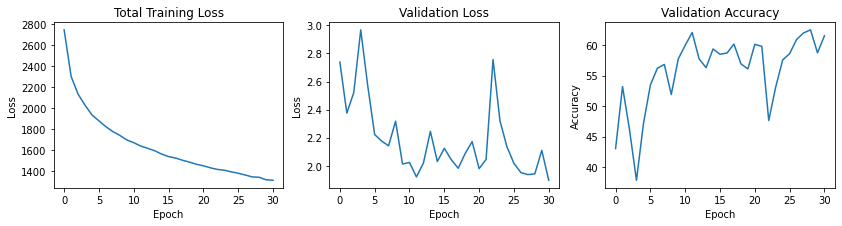

In [38]:
#Using Best Parameters for 0 Hidden Layer Model

# Best Model Parameters with 0 Hidden Layers is:
#         Batch Size : 16  , Learning Rate :0.005 , Activation Function : sigmoid 

layer_dims_0_rgb = [input_layer*3 , output_layer ]  # No hidden layers
layer_dims_1_rgb = [input_layer*3, 144 , output_layer ]  # 1 hidden layer
layer_dims_2_rgb = [input_layer*3, 144 , 64 , output_layer ]  # 2 hidden layers

print('Model with No Hidden Layer, batch_size=16, activation function= sigmoid, learning rate=0.005 ')
weights, biases = train(x_train_rgb, y_train_rgb, x_validation_rgb, y_validation_rgb, layer_dims_0_rgb,  activation_function='sigmoid',
                        epochs = 30, batch_size = 16, learning_rate=0.005)

save_model(weights, biases, 'model_0hl_sigmoid_16bs_005lr_rgb')


Best Model Parameters with 0 Hidden Layers is:
        Batch Size : 16  , Learning Rate :0.005 , Activation Function : sigmoid 

 Classification Report 
              precision    recall  f1-score   support

        Bean       0.34      0.74      0.47        92
Bitter_Gourd       0.66      0.66      0.66       200
Bottle_Gourd       0.70      0.57      0.63       246
     Brinjal       0.45      0.67      0.54       134
    Broccoli       0.76      0.52      0.62       290
     Cabbage       0.38      0.59      0.46       128
    Capsicum       0.73      0.62      0.67       237
      Carrot       0.81      0.90      0.85       181
 Cauliflower       0.72      0.41      0.53       350
    Cucumber       0.64      0.72      0.68       177
      Papaya       0.71      0.75      0.73       190
      Potato       0.62      0.76      0.68       163
     Pumpkin       0.47      0.46      0.46       203
      Radish       0.70      0.54      0.61       259
      Tomato       0.42      0.56   

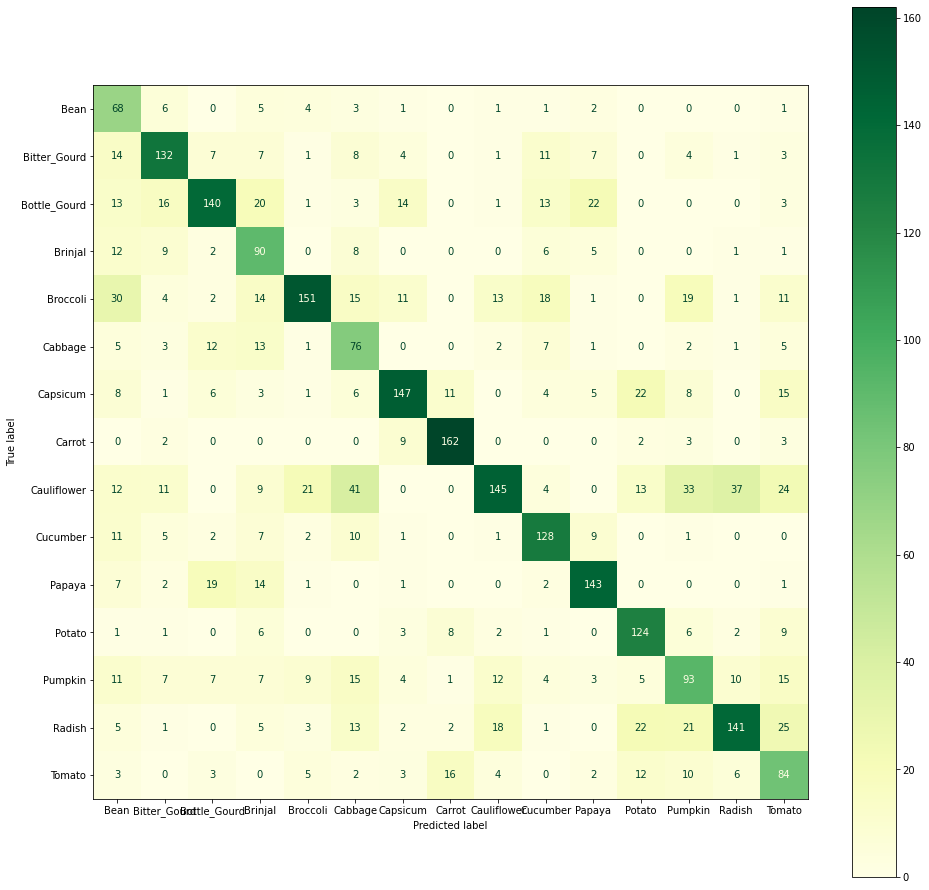

In [68]:
anaylsis_for_model('model_0hl_sigmoid_16bs_005lr_rgb',x_test_rgb, y_test_rgb)

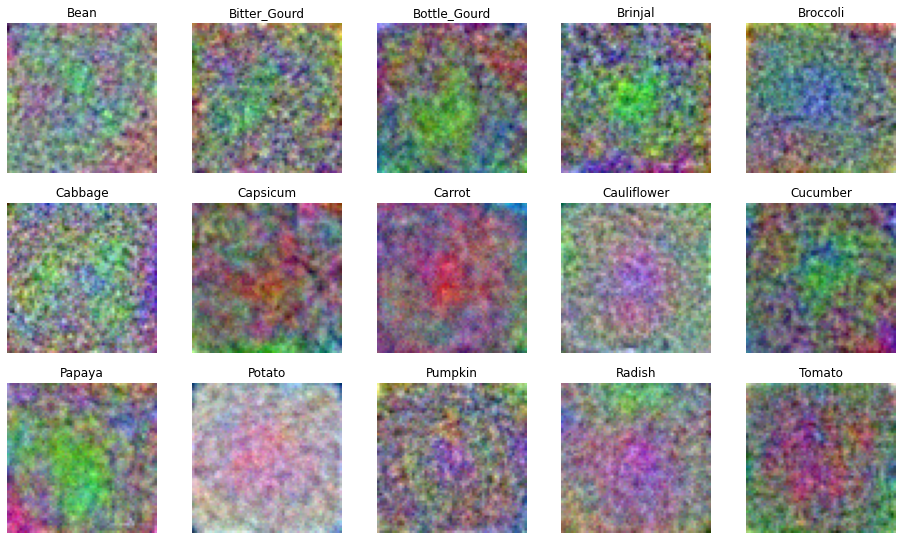

In [76]:
#weights of 1st hidden layer which is output layer
weights, biases =load_model('model_0hl_sigmoid_16bs_005lr_rgb')
plot_weights(weights[0], 5,5, 15 , (60,60,3), True)

<h1  style="color:#805b36 ;background:#FFD8B2">1-Hidden Layer Model Using RGB-Level Images  </h1>

Model with One Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 
Training begins...
Epoch 0: Total Training Loss = 2728.850 , Validation Loss = 2.664 , Validation Accuracy = 36.333
            
Epoch 10: Total Training Loss = 732.329 , Validation Loss = 1.412 , Validation Accuracy = 74.300
            
Epoch 20: Total Training Loss = 256.938 , Validation Loss = 1.074 , Validation Accuracy = 82.200
            
Epoch 30: Total Training Loss = 92.491 , Validation Loss = 1.996 , Validation Accuracy = 74.500
            
Early Stopping applied.


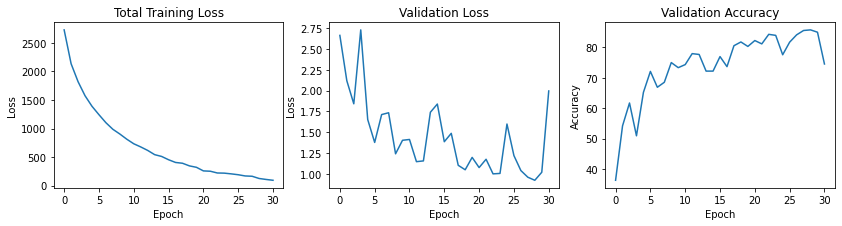

In [46]:
#Using Best Parameters for 1 Hidden Layer Model

# Best Model Parameters with 1 Hidden Layers is:
#         Batch Size : 16  , Learning Rate :0.02 , Activation Function : relu 

print('Model with One Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train_rgb, y_train_rgb, x_validation_rgb, y_validation_rgb, layer_dims_1_rgb,
                        activation_function='ReLU', epochs = 30, batch_size = 16, learning_rate=0.02)

save_model(weights, biases, 'model_1hl_relu_16bs_02lr_rgb')


Best Model Parameters with 1 Hidden Layers is:
        Batch Size : 16  , Learning Rate :0.02 , Activation Function : relu 

 Classification Report 
              precision    recall  f1-score   support

        Bean       0.64      0.91      0.75       140
Bitter_Gourd       0.86      0.83      0.85       209
Bottle_Gourd       0.93      0.88      0.91       211
     Brinjal       0.82      0.81      0.81       203
    Broccoli       0.96      0.67      0.79       290
     Cabbage       0.74      0.82      0.78       181
    Capsicum       0.93      0.97      0.95       192
      Carrot       0.99      0.93      0.96       214
 Cauliflower       0.75      0.85      0.80       177
    Cucumber       0.83      0.90      0.87       185
      Papaya       0.94      0.87      0.90       218
      Potato       0.89      0.95      0.92       188
     Pumpkin       0.76      0.84      0.79       180
      Radish       0.95      0.85      0.90       223
      Tomato       0.74      0.79      0

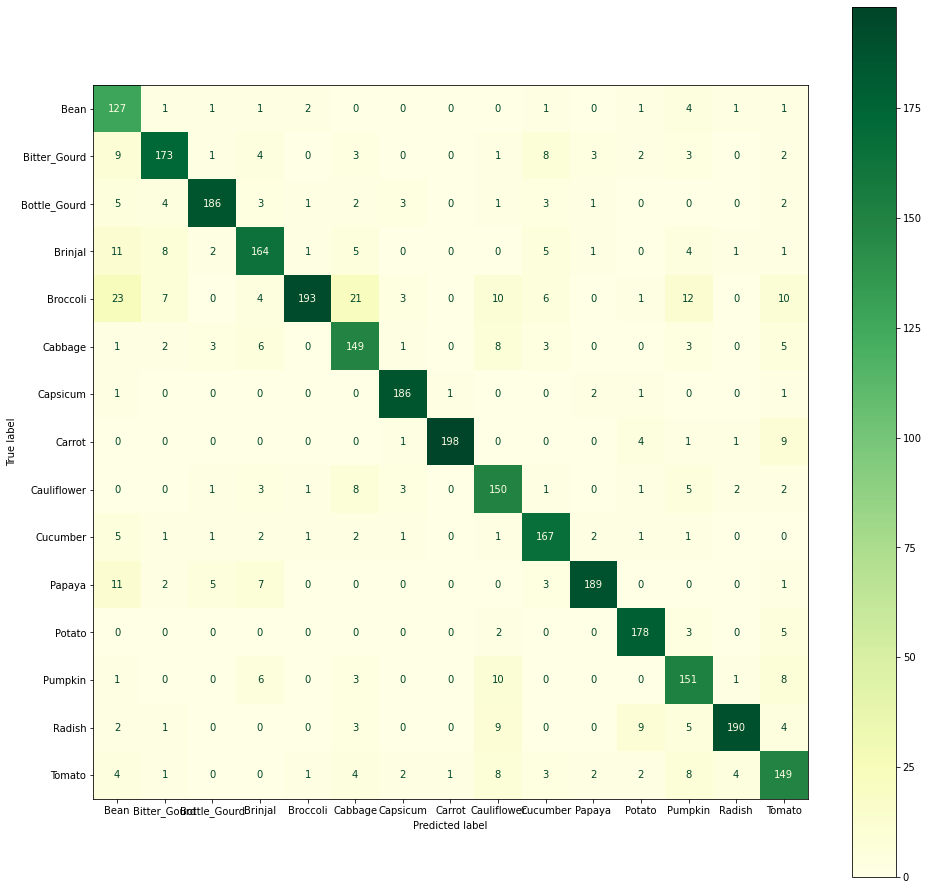

In [70]:
anaylsis_for_model('model_1hl_relu_16bs_02lr_rgb',x_test_rgb, y_test_rgb)

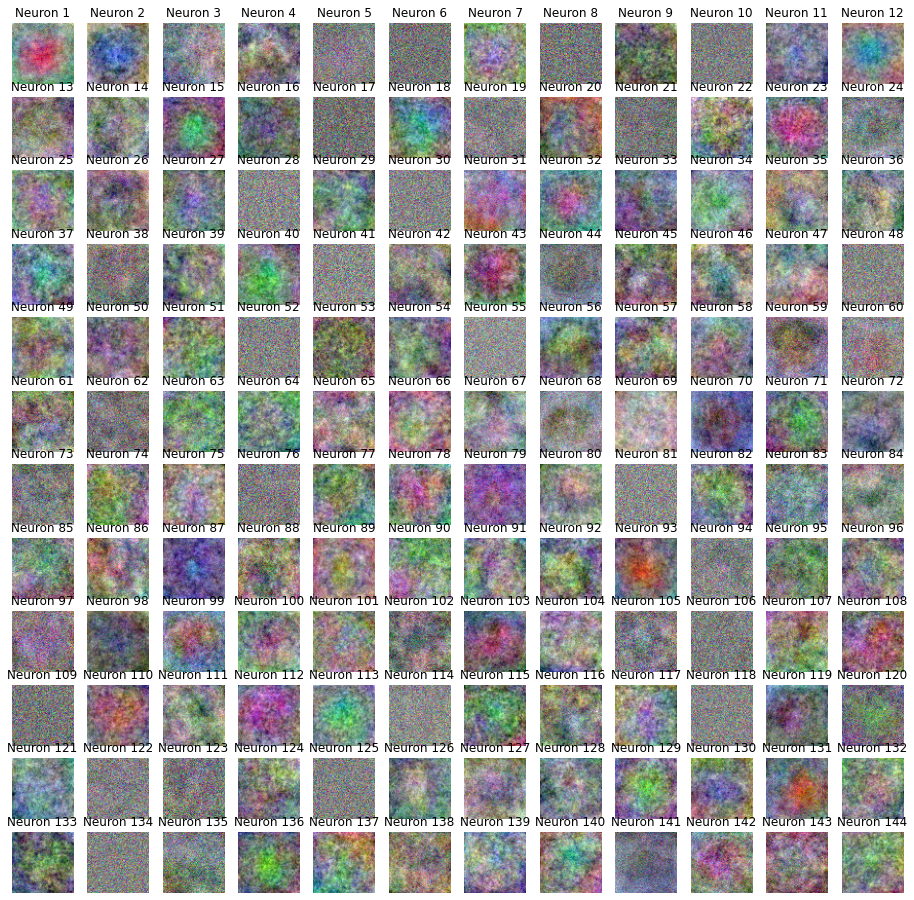

In [71]:
#weights of 1st hidden layer
weights, biases =load_model('model_1hl_relu_16bs_02lr_rgb')
plot_weights(weights[0], 12,12, 144 , (60,60,3), False)

<h1  style="color:#805b36 ;background:#FFD8B2">2-Hidden Layer Model Using RGB-Level Images  </h1>

Model with Two Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 
Training begins...
Epoch 0: Total Training Loss = 3408.941 , Validation Loss = 3.354 , Validation Accuracy = 19.700
            
Epoch 10: Total Training Loss = 1107.948 , Validation Loss = 1.504 , Validation Accuracy = 69.600
            
Epoch 20: Total Training Loss = 463.062 , Validation Loss = 1.074 , Validation Accuracy = 83.000
            
Epoch 30: Total Training Loss = 213.549 , Validation Loss = 1.304 , Validation Accuracy = 80.900
            
Early Stopping applied.


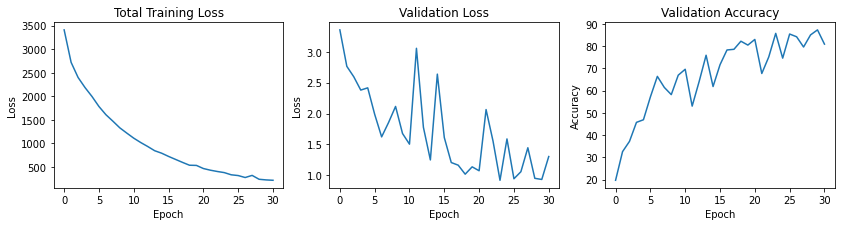

In [57]:
#Using Best Parameters for 0 Hidden Layer Model

# Best Model Parameters with 2 Hidden Layers is:
#         Batch Size : 16  , Learning Rate :0.02 , Activation Function : relu 

np.seterr(divide = 'ignore') 
print('Model with Two Hidden Layer, batch_size=16, activation function= ReLU, learning rate=0.02 ')
weights, biases = train(x_train_rgb, y_train_rgb, x_validation_rgb, y_validation_rgb, layer_dims_2_rgb,
                        activation_function='ReLU', epochs = 30, batch_size = 16, learning_rate=0.02)

save_model(weights, biases, 'model_2hl_relu_16bs_02lr_rgb')


Best Model Parameters with 2 Hidden Layers is:
        Batch Size : 16  , Learning Rate :0.02 , Activation Function : relu 

 Classification Report 
              precision    recall  f1-score   support

        Bean       0.72      0.88      0.80       164
Bitter_Gourd       0.90      0.85      0.87       213
Bottle_Gourd       0.98      0.89      0.93       220
     Brinjal       0.84      0.87      0.85       194
    Broccoli       0.91      0.77      0.83       236
     Cabbage       0.88      0.72      0.79       245
    Capsicum       0.94      0.97      0.96       194
      Carrot       0.99      0.96      0.97       207
 Cauliflower       0.72      0.90      0.80       160
    Cucumber       0.85      0.93      0.89       183
      Papaya       0.93      0.92      0.92       201
      Potato       0.94      0.95      0.95       197
     Pumpkin       0.83      0.83      0.83       201
      Radish       0.95      0.92      0.94       206
      Tomato       0.75      0.84      0

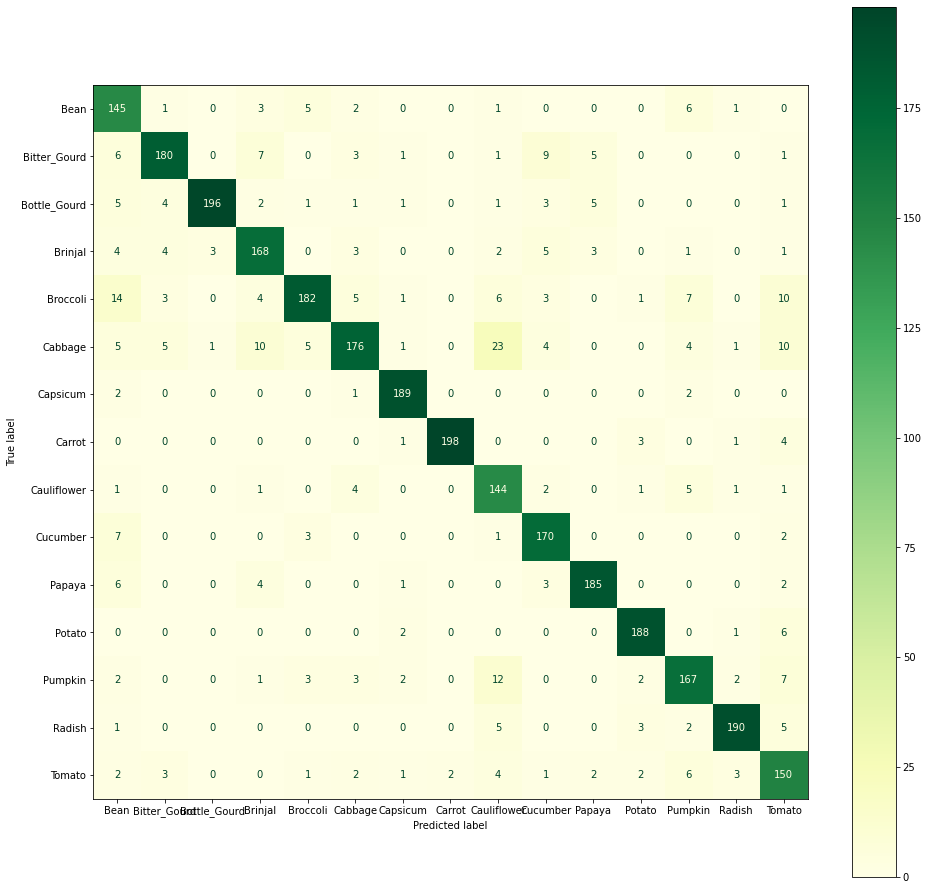

In [69]:
anaylsis_for_model('model_2hl_relu_16bs_02lr_rgb',x_test_rgb, y_test_rgb)

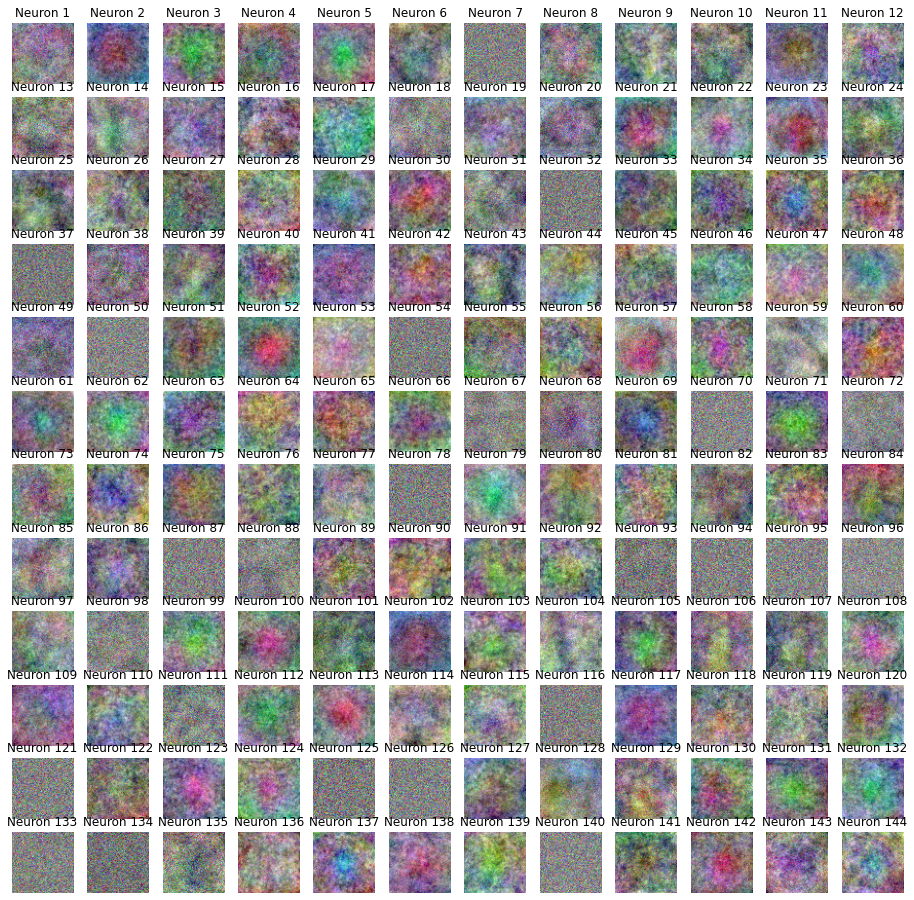

In [72]:
#weights of 1st hidden layer
weights, biases =load_model('model_2hl_relu_16bs_02lr_rgb')
plot_weights(weights[0], 12,12, 144 , (60,60,3), False)


<h1 style="font-weight: 600;text-transform:uppercase; color:#c63737 ; background:#FFCDD2"> Conclusion of Using RGB-Level Images Instead of Gray-Level Images</h1>


<h1  style="color:#805b36 ;background:#FFD8B2"> Accuracy Difference Table Trained With Best Models Parameters </h1>
<table>
  <tr>
    <th></th>
    <th>Gray-Level</th>
    <th>RGB-Level</th>
  </tr>
  <tr>
    <td>0-Hidden Layer Model</td>
    <td>36.600</td>
    <td>60.800</td>
  </tr>
  <tr>
    <td>1-Hidden Layer Model</td>
    <td> 52.967</td>
    <td> 85.000 </td>
  </tr>
  <tr>
    <td>2-Hidden Layer Model</td>
    <td>61.067</td>
    <td>87.600</td>
  </tr>
</table>

As clearly can be seen, accuracies are increasing around %20-25 when we use RGB-Level images instead of Gray-Level images. Its because our features with RGB data are 3 times more than grayscaled data features and in result its more descriptive. Number of neurons in input layer also tripled and so that training time is slightly increased.
When training neural network for image classification, using RGB-Level images is a proper way to go.

<h1 style="font-size: 40px; font-weight: 600;text-transform:uppercase; color:#256029; background:#C8E6C9">Part 2: Convolutional Neural Network </h1>

<h3 style="font-weight: 600;text-transform:uppercase; color:#c63737 ; background:#FFCDD2"> Problem Definition,Solution Steps and Implementation</h3>
<ul>
    <li><span style="color:#c63737 ;">Problem Definition </span>
            In second part of this project, we are asked to implement Convolutional Neural Network for classifying the same images in the first part. We are going to implement two different models. One of the model will be finetuned with all of its parameters. However, for the other model, its just last two fully connected layers will be finetuned.
    </li>  
    <li><span style="color:#c63737 ; ">Solution Steps and Implementation : </span> 
       In order to solve this classification problem, we have used very useful ready-made libraries such as PyTorch. With using PyTorch we have created our CNN model and then trained it with train data. After the training process, we have tested our model. We have extracted classification report and confusion matrix from the test results to understand our model's performance.
    </li> 
</ul>

In [35]:
# Neccessary libraries for Part-2
import torch
from torch import optim
import torch.nn as nn
import torchvision
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
from torchvision import models
import torchvision.transforms as transforms
import seaborn as sn
import pandas as pd
import torch.nn.functional as F
from torchvision.datasets import ImageFolder
from torch.utils.data import  DataLoader
from torch.utils.data.dataloader import default_collate

In [36]:
train_path = "Vegetable Images/train"                  # path for training data
validation_path = "Vegetable Images/validation"        # path for validation data
test_path = "Vegetable Images/test"                    # path for test data

In [37]:
classes={}
l1 = os.listdir(train_path)
l1.sort()

for i, folder in enumerate(l1):
    classes[folder] = i  
    
classes                      # 15 classes which are labels for the output layer

{'Bean': 0,
 'Bitter_Gourd': 1,
 'Bottle_Gourd': 2,
 'Brinjal': 3,
 'Broccoli': 4,
 'Cabbage': 5,
 'Capsicum': 6,
 'Carrot': 7,
 'Cauliflower': 8,
 'Cucumber': 9,
 'Papaya': 10,
 'Potato': 11,
 'Pumpkin': 12,
 'Radish': 13,
 'Tomato': 14}

In [39]:
def read_images_CNN(path, classes):                       # read all images in the given path
    l = []
    for folder in os.listdir(path):
        for file_path in glob.glob(str(path +'/' + folder + '/*.jpg')):
            img = Image.open(file_path)
            img = img.resize((60,60))                     # resize all images to 32x32
            tmp = (img,classes[folder])
            l.append(tmp)
    return l

In [40]:
train_set = read_images_CNN(train_path, classes)                   # read train images
validation_set = read_images_CNN(validation_path, classes)         # read validation images
test_set = read_images_CNN(test_path, classes)                     # read test images

# first element of a test set which is a tuple with RGB image sized 32x32 and its class label
img = test_set[0]
img

(<PIL.Image.Image image mode=RGB size=60x60 at 0x29915BB4F10>, 0)

In [41]:
# same classes within a tuple indexed 0 to 15
CNN_classes = ('Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 
               'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato')

my_CNN_classes = list(CNN_classes)

In [42]:
def convert_to_tensor(dataset):                                   # convert the given dataset to pytorch tensor
    for i in range(len(dataset)):
        convert_tensor = transforms.ToTensor()
        tmp = (convert_tensor(dataset[i][0]), dataset[i][1])
        dataset[i] = tmp
        
convert_to_tensor(train_set)                                     # train set converting
convert_to_tensor(validation_set)                                # validation set converting
convert_to_tensor(test_set)                                      # test set converting

In [43]:
# all tensors in train, validation, test sets will run on GPU
def do_cuda(dataset):
    for i in range(len(dataset)):
        a, b = dataset[i][0].to("cuda"), dataset[i][1]
        dataset[i] = (a, b)
        
        
do_cuda(train_set)
do_cuda(validation_set)
do_cuda(test_set)

In [44]:
# get the all datasets' loaders
def get_loaders(batch_size, train_set, validation_set, test_set):
    train_loader = torch.utils.data.DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)

    validation_loader = torch.utils.data.DataLoader(dataset=validation_set, batch_size=batch_size)
    
    test_loader = torch.utils.data.DataLoader(dataset=test_set, batch_size=batch_size)
    
    return train_loader, validation_loader, test_loader

In [45]:
train_loader, validation_loader, test_loader = get_loaders(32, train_set, validation_set, test_set)

In [46]:
# train and test transforms
train_transform = transforms.Compose([
        transforms.Resize ( (60 , 60) ),
        #transforms.ColorJitter(),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    
test_transform =   transforms.Compose([
        transforms.Resize ( (60 , 60) ),        
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])

In [47]:
# run all the code in GPU(cuda)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))

True
NVIDIA GeForce GTX 1660 Ti


In [48]:
# VGG19 CNN model from pytorch library
model = models.vgg19(pretrained = True)
model2 = models.vgg19(pretrained = True)

In [49]:
# disable model's parameters
def grad_parameters(mdl): 
    for p in mdl.parameters():
        p.requires_grad = False


grad_parameters(model)
grad_parameters(model2)


In [50]:
  model.classifier = nn.Sequential(
      
  nn.Linear(in_features=25088, out_features=2048) ,
  nn.ReLU(),
  nn.Linear(in_features=2048, out_features=512) ,
  nn.ReLU(),
  nn.Dropout(p=0.6), 
    
  nn.Linear(in_features=512 , out_features=15),
  nn.LogSoftmax(dim=1)  
)

In [51]:
  model2.classifier = nn.Sequential(
      
  nn.Linear(in_features=25088, out_features=2048) ,
  nn.ReLU(),
  nn.Linear(in_features=2048, out_features=512) ,
  nn.ReLU(),
  nn.Dropout(p=0.6), 
    
  nn.Linear(in_features=512 , out_features=15),
  nn.LogSoftmax(dim=1)  
)

In [52]:
# model parameters
model

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [53]:
# two different model:
# one of the finetunes all of its layers
# the other one just finutes just last two fully connected layers
model = model.to(device)
model2 = model2.to(device)

In [54]:

# optimizer for first model
# all parameters will be updated
optimizer = optim.Adam(model.parameters(), lr = 0.005)
criterion = nn.CrossEntropyLoss()

# just last two fully connected layers to update
params_to_update = []
model2_parameters = list(model2.parameters())
params_to_update = model2_parameters[-2:]
# optimizer for second model
optimizer2 = optim.SGD(params_to_update, lr = 0.005)
criterion2 = nn.CrossEntropyLoss()

In [55]:
# get all the predictions for the entire training set
def get_all_preds(model, loader):
    all_preds = torch.tensor([]).to(device)
    model.eval()
    
    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device)
        preds = model(images)
        all_preds = torch.cat((all_preds, preds), dim=0)
    
    return all_preds

# return the accuracy of the model
def get_accuracy(model, loader):
    with torch.no_grad(): # disable gradient computations 
        test_preds = get_all_preds(model, loader)
        
    l = []
    for i in range(len(test_set)):
        l.append(test_set[i][1])
    
    l = np.array(l)
        
    acc_score = accuracy_score(l, test_preds.cpu().argmax(dim=1).numpy())
    
    return acc_score

In [60]:
def CNN_train(train_loader, validation_loader, model, criterion, optimizer, device, num_epochs):
    acc_list = []
    last_acc = 0                      # will be used for early-stopping
    t = time.time()
    for epoch in range(num_epochs):
        #Load in the data in batches using the train_loader object
        for images, labels in train_loader:  
            # Move tensors to the configured device
            
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        
        acc_score = get_accuracy(model, validation_loader)
        
        if (epoch + 1) % 10 == 0 or (epoch+1)==1:
            print('Epoch {}, Loss: {:.4f}'.format(epoch+1, loss.item()))
            #acc_score = get_accuracy(model, validation_loader)
            print("Validation accuracy:", acc_score)
            
            # if new calculated accuracy is lower than 10 epochs before accuracy exit the function
            if acc_score < last_acc:
                print("Early stopping applied.")
                print("Passed time for training in seconds is:", time.time() - t)
                return acc_list
            
            last_acc = acc_score
            
        acc_list.append(acc_score)
            
    print("Passed time for training in seconds is:", time.time() - t)
    return acc_list

In [61]:
# first model training process
acc_list_1 = CNN_train(train_loader, validation_loader, model, criterion, optimizer, device, num_epochs=35)

Epoch 1, Loss: 0.5379
Validation accuracy: 0.841
Epoch 10, Loss: 0.1865
Validation accuracy: 0.8933333333333333
Epoch 20, Loss: 0.4041
Validation accuracy: 0.897
Epoch 30, Loss: 0.2411
Validation accuracy: 0.8776666666666667
Early stopping applied.
Passed time for training in seconds is: 607.3877732753754


In [62]:
# second model training process
acc_list_2 = CNN_train(train_loader, validation_loader, model2, criterion2, optimizer2, device, num_epochs=35)

Epoch 1, Loss: 2.6627
Validation accuracy: 0.19033333333333333
Epoch 10, Loss: 1.9431
Validation accuracy: 0.5546666666666666
Epoch 20, Loss: 1.9303
Validation accuracy: 0.6103333333333333
Epoch 30, Loss: 1.6671
Validation accuracy: 0.6303333333333333
Passed time for training in seconds is: 448.4147598743439


In [63]:
# testing the CNN model
def CNN_test(model, loader):
    with torch.no_grad(): # disable gradient computations 
        test_preds = get_all_preds(model, loader)
    
    l = []
    for i in range(len(test_set)):
        l.append(test_set[i][1])
    
    l = np.array(l)
        
    cr = classification_report(l, test_preds.cpu().argmax(dim=1).numpy(), labels=np.unique(l))
    cf = confusion_matrix(l, test_preds.cpu().argmax(dim=1).numpy(), labels=np.unique(l))
    return cr , cf

In [64]:
cr1, cf1 = CNN_test(model, test_loader)
cr2, cf2 = CNN_test(model2, test_loader)

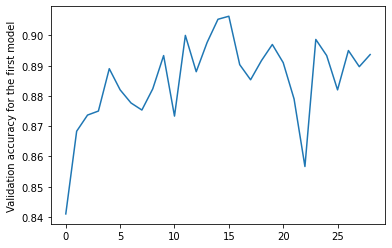

In [66]:
# early-stopping has occured in the first model, and did not train for last 10 epochs
plt.plot(list(range(0, len(acc_list_1))), acc_list_1)
plt.ylabel('Validation accuracy for the first model')
plt.show()

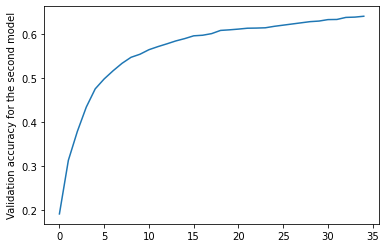

In [67]:
plt.plot(list(range(0, len(acc_list_2))), acc_list_2)
plt.ylabel('Validation accuracy for the second model')
plt.show()

In [68]:
# for displaying the confusion matrix
def show_confusion_matrix(cf, CNN_classes):
    df_cm = pd.DataFrame(cf, index = [i for i in CNN_classes],
              columns = [i for i in CNN_classes])
    plt.figure(figsize = (15,15))
    sn.heatmap(df_cm, annot=True,cmap="YlGn")

              precision    recall  f1-score   support

           0       0.96      0.89      0.92       200
           1       0.89      0.96      0.93       200
           2       0.97      0.94      0.96       200
           3       0.93      0.75      0.83       200
           4       0.91      0.75      0.82       200
           5       0.80      0.85      0.82       200
           6       0.96      0.95      0.96       200
           7       1.00      0.96      0.98       200
           8       0.87      0.80      0.83       200
           9       0.93      0.86      0.90       200
          10       0.85      0.96      0.90       200
          11       0.97      0.98      0.98       200
          12       0.95      0.72      0.82       200
          13       0.99      0.72      0.84       200
          14       0.47      0.89      0.61       200

    accuracy                           0.87      3000
   macro avg       0.90      0.87      0.87      3000
weighted avg       0.90   

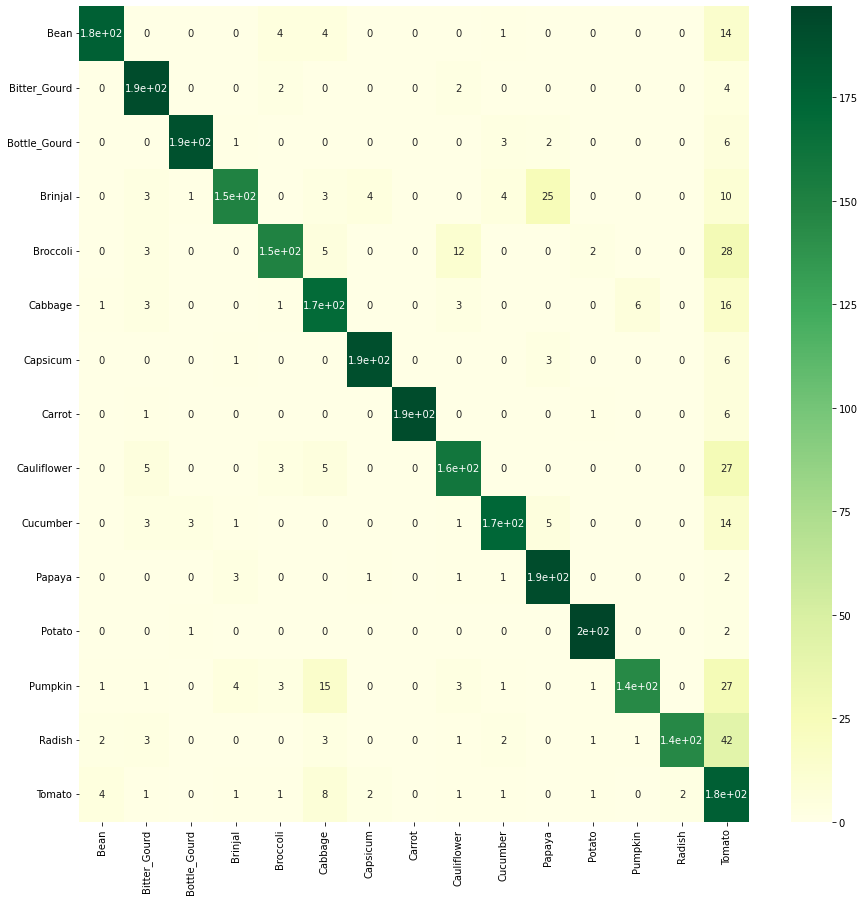

In [69]:
# first model whose all parameters has been trained
acc1 = get_accuracy(model, test_loader)
print(cr1)
print("Accuracy:", acc1 * 100)

show_confusion_matrix(cf1, CNN_classes)

              precision    recall  f1-score   support

           0       0.59      0.68      0.63       200
           1       0.58      0.69      0.63       200
           2       0.66      0.79      0.72       200
           3       0.66      0.53      0.59       200
           4       0.53      0.52      0.53       200
           5       0.56      0.33      0.42       200
           6       0.74      0.72      0.73       200
           7       0.86      0.63      0.73       200
           8       0.68      0.61      0.64       200
           9       0.60      0.58      0.59       200
          10       0.64      0.69      0.67       200
          11       0.61      0.90      0.72       200
          12       0.75      0.50      0.60       200
          13       0.58      0.64      0.61       200
          14       0.50      0.61      0.55       200

    accuracy                           0.63      3000
   macro avg       0.64      0.63      0.62      3000
weighted avg       0.64   

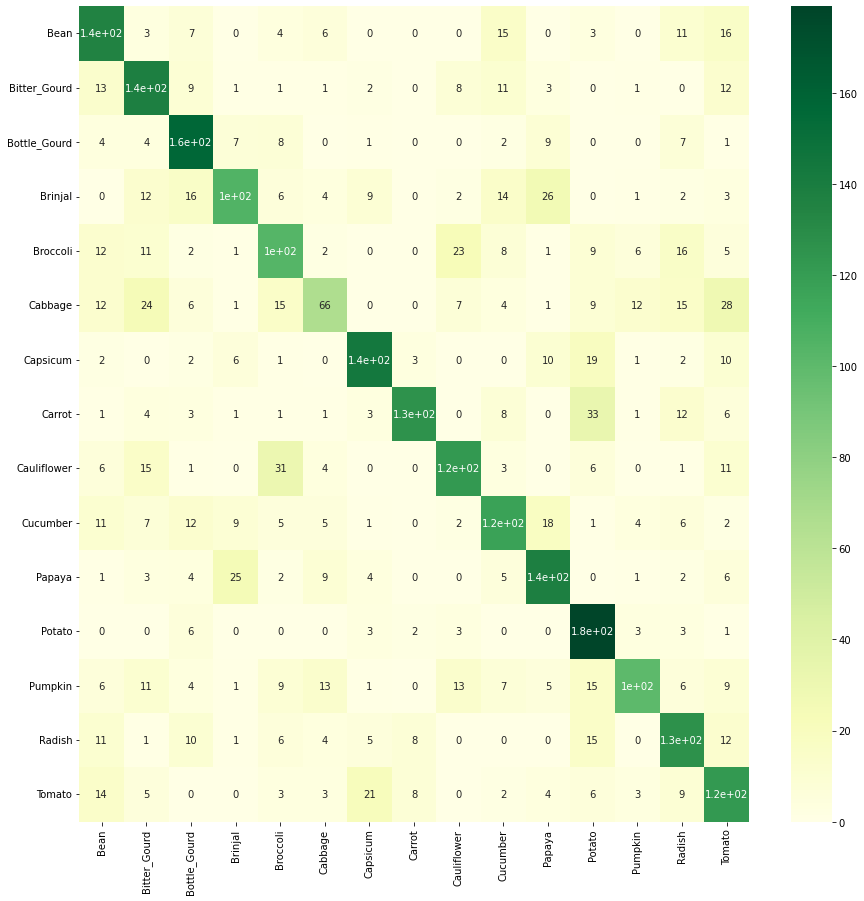

In [70]:
# second model whose just last 2 fully connected layers has been trained
acc2 = get_accuracy(model2, test_loader)
print(cr2)
print("Accuracy:", acc2 * 100)

show_confusion_matrix(cf2, CNN_classes)

In [71]:
# funciton to visualize the CNN layer image presentations
def custom_viz(kernels, path=None, cols=None):
    
    def set_size(w,h, ax=None):
        if not ax:
            ax=plt.gca()
        
        l = ax.figure.subplotpars.left
        r = ax.figure.subplotpars.right
        t = ax.figure.subplotpars.top
        b = ax.figure.subplotpars.bottom
        figw = float(w)/(r-l)
        figh = float(h)/(t-b)
        ax.figure.set_size_inches(figw, figh)
    
    N = kernels.shape[0]
    C = kernels.shape[1]

    Tot = N*C
        
    if C>1:
        columns = C
    elif cols==None:
        columns = N
    elif cols:
        columns = cols
        
    rows = Tot // columns 
    rows += Tot % columns

    pos = range(1,Tot + 1)

    fig = plt.figure(1)
    fig.tight_layout()
    k=0
    
    for i in range(kernels.shape[0]):
        for j in range(kernels.shape[1]):
            img = kernels[i][j]
            ax = fig.add_subplot(rows,columns,pos[k])
            ax.imshow(img, cmap='gray')
            plt.axis('off')
            k = k+1

    set_size(30,30,ax)
    
    """if path:
        plt.savefig(path, dpi=100)
    """
    plt.show()

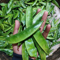

In [72]:
# an example image
img[0]

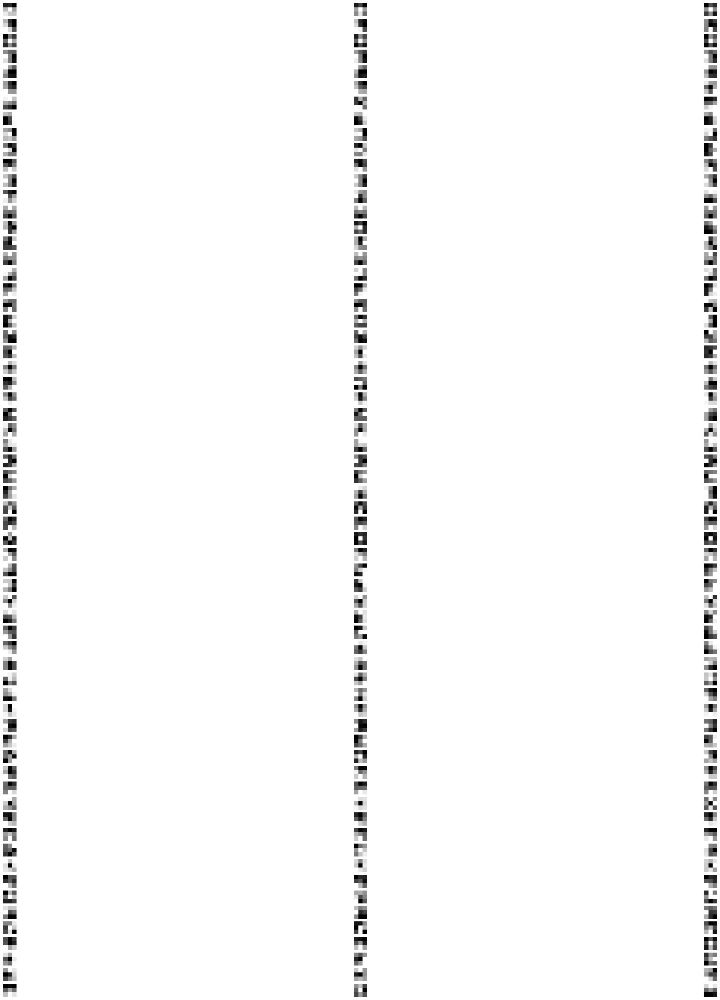

In [73]:
# first layer's presentation
kernels = model.features[0].weight.cpu().detach().clone()
kernels = kernels - kernels.min()
kernels = kernels / kernels.max()
custom_viz(kernels, img[0], "layer1")

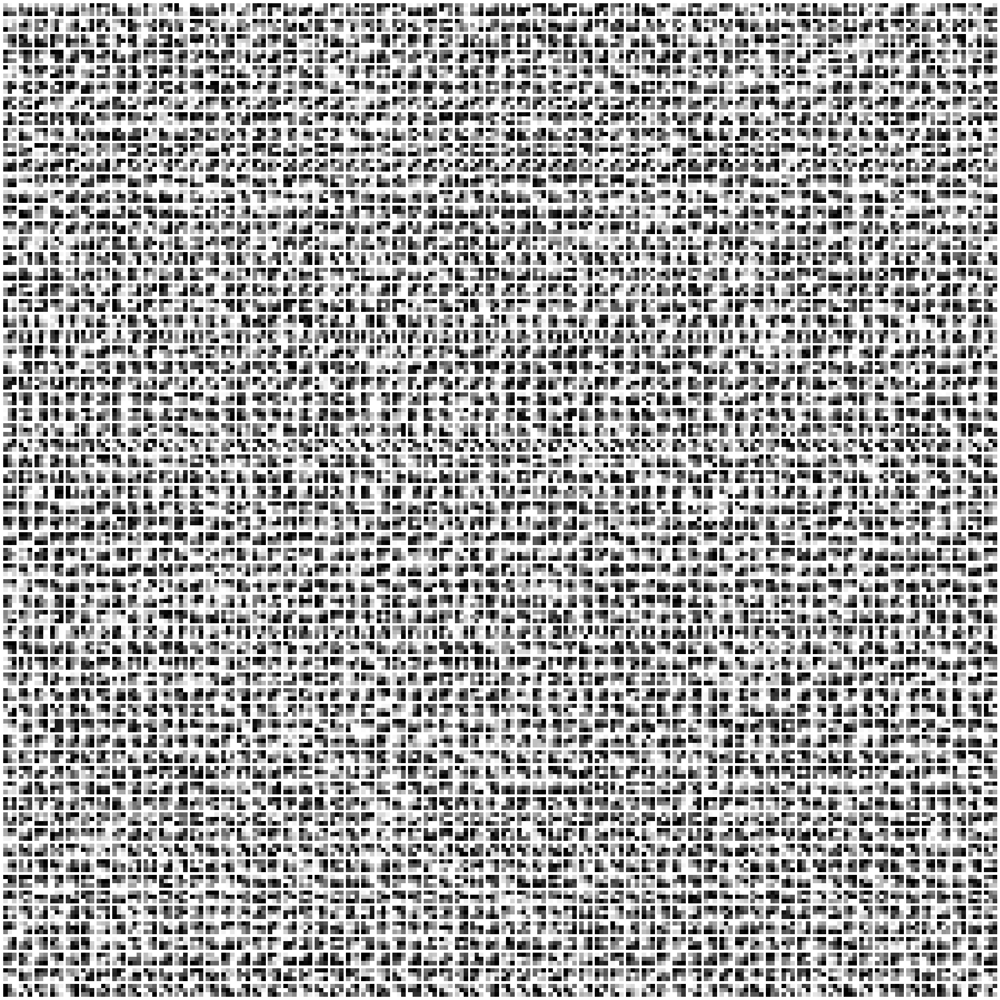

In [74]:
# next layer's presentation
kernels = model.features[2].weight.cpu().detach().clone()
kernels = kernels - kernels.min()
kernels = kernels / kernels.max()
custom_viz(kernels, img[0], "layer2")

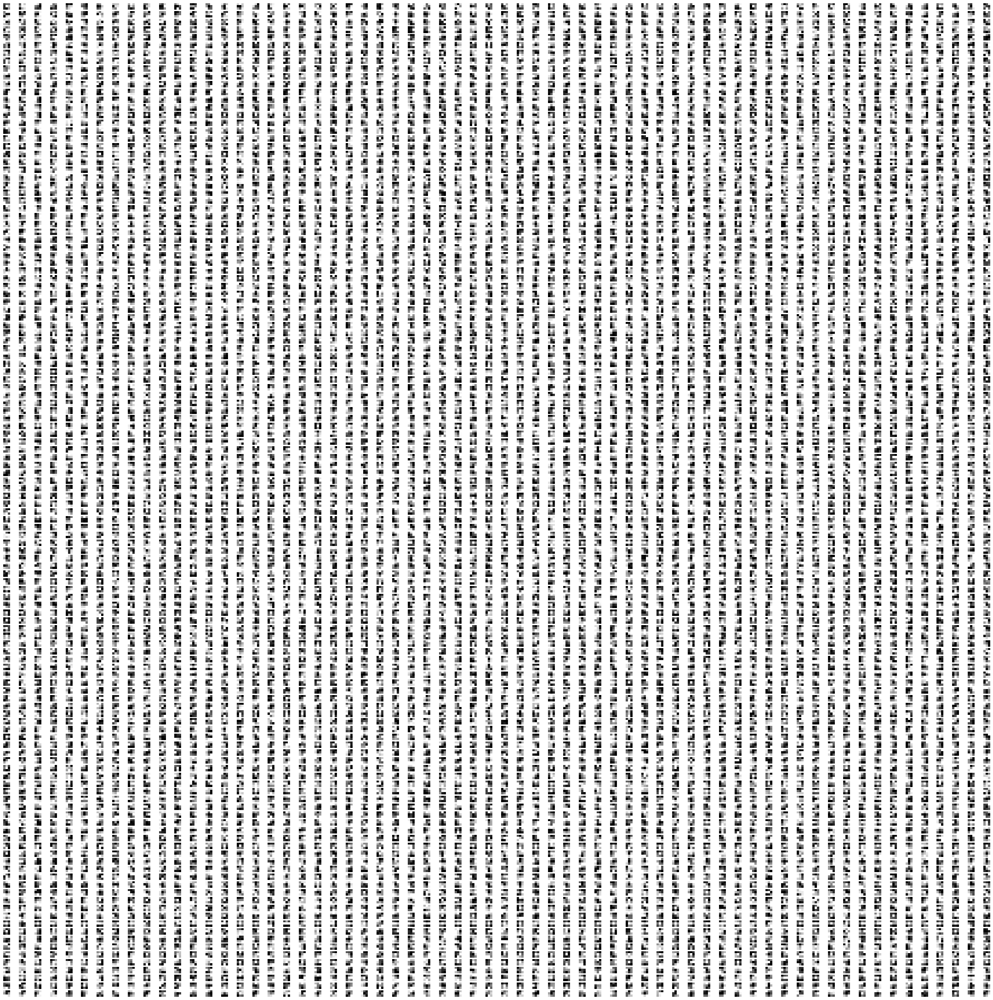

In [75]:
# next layer's presentation
kernels = model.features[5].weight.cpu().detach().clone()
kernels = kernels - kernels.min()
kernels = kernels / kernels.max()
custom_viz(kernels, img[0], "layer3")


<h1 style=" font-size: 40px; font-weight: 600;text-transform:uppercase; color:#694382; background: #ECCFFF;">Analysis Of Part 2</h1>
<li>
For the second part of the project, we implemented a Convolutional Neural Network to classify images. Our train dataset images are sized 228x228. We reshaped this size to 60x60 in order to reduce to computational complexity. Although we reduce the image size, model's computational time is high. After reshaping process, we built our VGG-19 CNN model.
</li>
<li>
Convolutional Neural Networks have much better performance on classifying images rather than traditional neural networks. We can simply see that this inference from looking at the accuracy values for both CNN and NN models. One of the reason for this result is that convolutional neural networks reduce the high dimensionality of images without losing its information. Therefore, for image classification convolutional neural networks are the best choice.
</li>
<li>
We have two different CNN models. One of them is a model whose all parameters are finetuned. The other one is also a CNN model but its just last two fully connected layers are finetuned. So, we can easily say that the first model has a better performance. Because, during finetuning, its all weights are changed and fit better. When we look at the classification reports and confusion matrices of these two CNN models, we can see that the first model's accuracy is around %90 and the second model's accuracy is around %60. Thus, the first model is a really good image classifier. However, we cannot say the same thing about the other model. We can also look at other performance metrics such as precision, recall and F1-score. First model's results for these metrics are higher than second model. We can conclude that, if we want a better performance we should finetune the weights of all layers in the Convolutional Neural Network.
</li>